https://www.kaggle.com/code/vijeetnigam26/anomaly-detection-in-multivariate-time-series/notebook

<h2> 🕵🏻 Anomaly Detection in 📈 Multivariate ⏳ Time-Series </h2>

* Resolved Data Anomalies/Outliers in 3 different Multivariate Time Series Data Sets related to [**Health Care**](https://www.kaggle.com/code/vijeetnigam26/anomaly-detection-ecg-autoencoders), [**Tourism**](https://www.kaggle.com/code/vijeetnigam26/anomaly-detection-expedia-hotel), and [**Transportation Sectors**](https://www.kaggle.com/code/vijeetnigam26/anomaly-detection-sensors-var).
* Implemented and Compared **ANN, VAR, Isolation forests, K-Means Clustering, PCA,** and **SVM** to get the best model accuracy.
* Built an efficient **Autoencoders** Model with an accuracy of **94.96%**.
* Applied Neural Networks and Deep Learning Methods for detecting anomalies.

# 1️⃣ Problem Statement 1: ECG 🏥

**The objective of detecting anomalies in ECG signals consists of finding the irregular heart rates, heartbeats, and rhythms. To achieve this goal, an anomaly detection system must be able to find them on all heartbeat sequences; therefore, to obtain the essential metrics.**

An electrocardiogram (ECG) is a simple test that can be used to check your heart's rhythm and electrical activity. Sensors attached to the skin are used to detect the electrical signals produced by your heart each time it beats.


<img src="https://img.freepik.com/premium-photo/patient-monitor-showing-vital-signs-ecg-ekg-vector-illustration_42416-358.jpg?w=1060" height=75% width=75% style="margin-left:12.5%;">

<h3>Autoencoders</h3>

Autoencoder is an important application of Neural Networks or Deep Learning. It is widely used in dimensionality reduction, image compression, image denoising, and feature extraction. It is also applied in anomaly detection and has delivered superior results.

This notebook uses autoencoders for detecting anomaly in ECG(electro cardiogram) readings. 
This is one of the very good practical application of autoencoders. 

[**Reference**](https://www.kaggle.com/code/devavratatripathy/ecg-anomaly-detection-using-autoencoders/notebook)


In [80]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from tensorflow.keras import layers, losses
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Model
import plotly.graph_objects as go

import warnings
warnings.filterwarnings('ignore')

In [81]:
def show_traces(
    df: pd.DataFrame
):
    fig = go.Figure()
    for index, row in df.iterrows():
        fig.add_trace(go.Scatter(
            x=df.columns,  # 假设列名代表时间点
            y=row.values,  # 当前行的值
            mode='lines',  # 绘制线条模式
            name=str(index)  # 使用行索引作为图例名称
        ))
    fig.show()

In [82]:
df = pd.read_csv('http://storage.googleapis.com/download.tensorflow.org/data/ecg.csv', header=None)
print(df.shape)

show_traces(df.iloc[0:10,:])

(4998, 141)


👉🏻 **Note:** The dataset has 140 columns which represents the ECG readings and a labels column which has been encoded to **0 or 1** showing whether the ECG is **abnormal or normal**.

In [83]:
#separate the data and labels so that it will be easy for understanding
data = df.iloc[:,:-1].values
labels = df.iloc[:,-1].values
labels

array([1., 1., 1., ..., 0., 0., 0.])

In [84]:
train_data, test_data, train_labels, test_labels = train_test_split(data, labels, test_size = 0.2, random_state = 21)

<h3>Normalizing the data to the range [0-1]</h3>

<img src="https://cdn.wallstreetmojo.com/wp-content/uploads/2019/05/Normalization-Formula.jpg" height="55%" width="55%" style="margin-left: 22.5%;">

In [85]:
#Now lets Normalize the data
#First we will calculate the maximum and minimum value from the training set 
min = tf.reduce_min(train_data)
max = tf.reduce_max(train_data)

#Now we will use the formula (data - min)/(max - min)
train_data = (train_data - min)/(max - min)
test_data = (test_data - min)/(max - min)

#I have converted the data into float
train_data = tf.cast(train_data, dtype=tf.float32)
test_data = tf.cast(test_data, dtype=tf.float32)

In [86]:
#The labels are either 0 or 1, so I will convert them into boolean(true or false) 
train_labels = train_labels.astype(bool)
test_labels = test_labels.astype(bool)

#Now let's separate the data for normal ECG from that of abnormal ones
#Normal ECG data
n_train_data = train_data[train_labels]
n_test_data = test_data[test_labels]

#Abnormal ECG data
an_train_data = train_data[~train_labels]
an_test_data = test_data[~test_labels]

print(n_train_data)

tf.Tensor(
[[0.57030463 0.46561658 0.29058117 ... 0.48504233 0.4233502  0.47598344]
 [0.48320588 0.28246963 0.16471253 ... 0.567567   0.4677294  0.2692329 ]
 [0.48144642 0.35151404 0.25972766 ... 0.5479421  0.5077544  0.54298663]
 ...
 [0.41039047 0.24164985 0.13120876 ... 0.5277313  0.5654091  0.5023885 ]
 [0.5397748  0.4140786  0.28101394 ... 0.51266515 0.43706053 0.4426865 ]
 [0.29639772 0.15988176 0.18883787 ... 0.53766966 0.545786   0.40826708]], shape=(2359, 140), dtype=float32)


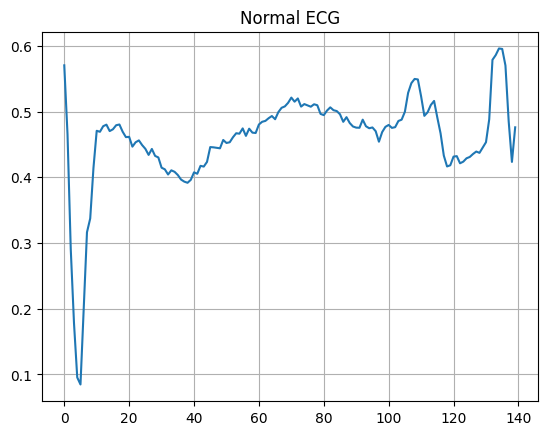

In [87]:
#Lets plot a normal ECG
plt.plot(np.arange(140), n_train_data[0])
plt.grid()
plt.title('Normal ECG')
plt.show()

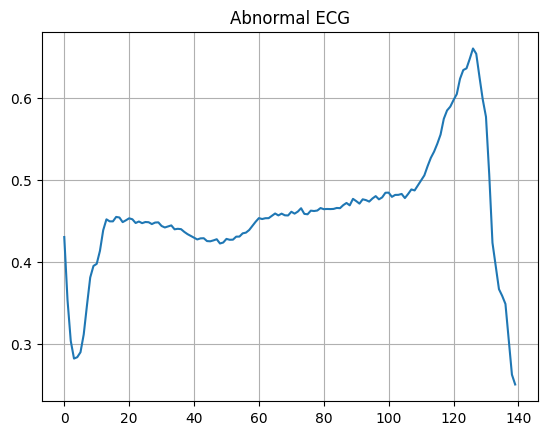

In [88]:
#Lets plot one from abnormal ECG
plt.plot(np.arange(140), an_train_data[0])
plt.grid()
plt.title('Abnormal ECG')
plt.show()

# 1.1 Autoencoders 

Autoencoders are a specific type of feedforward neural network.

It consists of two parts:-
1.Encoder
2.Decoder

<img src="https://miro.medium.com/max/1400/1*44eDEuZBEsmG_TCAKRI3Kw@2x.png" height=80% width=80% style="margin-left:10%">

# 1.2 Analysis 📝

<h3> ❓ How the model will detect anomaly ?</h3>

We will create an encoder and a decoder using an ANN architecture. We are going to provide the ECG data as input and the model will try to reconstruct it. The error between the original data and reconstructed output will be called the **reconstruction error**. Based on this recostruction error we are going to classify an ECG as anomalous or not.In order to do this we are going to train the model only on the normal ECG data but it will be tested on the full test set, so that when an abnormal ECG is provided in the input the autoencoder will try to reconstruct it but since it has been only trained on normal ECG data the output will have a larger reconstruction error. We will also define a minimum threshold for the error i.e. if the reconstruction error is above the threshold then it will be categorised as anomalous. 


For example, given an image of a handwritten digit, an autoencoder first encodes the image into a lower dimensional representation, then decodes it back to an image. It learns to compress the data while minimizing the reconstruction error. 

<img src="https://static.packt-cdn.com/products/9781789344158/graphics/assets/e8c5f6fa-9522-4fc2-b1a8-f10d4e451148.png" height=80% width=80% style="margin-left:10%">

👉🏻 *In simple words, AutoEncoder is an unsupervised Artificial Neural Network that attempts to encode the data by compressing it into the lower dimensions (bottleneck layer or code) and then decoding the data to reconstruct the original input. The bottleneck layer (or code) holds the compressed representation of the input data.* 

In [89]:
#Now let's define the model!
#Here I have used the Model Subclassing API (but we can also use the Sequential API)
#The model has 2 parts : 1. Encoder and 2. Decoder
 
class detector(Model):
  def __init__(self):
    super(detector, self).__init__()
    self.encoder = tf.keras.Sequential([
                                        layers.Dense(32, activation='relu'),
                                        layers.Dense(16, activation='relu'),
                                        layers.Dense(8, activation='relu')
    ])
    self.decoder = tf.keras.Sequential([
                                        layers.Dense(16, activation='relu'),
                                        layers.Dense(32, activation='relu'),
                                        layers.Dense(140, activation='sigmoid')
    ])

  def call(self, x):
    encoded = self.encoder(x)
    decoded = self.decoder(encoded)
    return decoded

👉🏻 **NOTE**: See that in fit() both the data are same i.e. n_train_data, the reason is that we will be comparing the original ECG with the reconstructed one to calculate the reconstruction error.
Autoencoders are unsupervised learning models but here we are training them using supervised method so its more like they are used as **self-supervised**.  

In [90]:
#Let's compile and train the model!!
autoencoder = detector()
autoencoder.compile(optimizer='adam', loss='mae')
autoencoder.fit(n_train_data, n_train_data, epochs = 20, batch_size=512, validation_data=(n_test_data, n_test_data))

Epoch 1/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0584 - val_loss: 0.0562
Epoch 2/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0557 - val_loss: 0.0532
Epoch 3/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0523 - val_loss: 0.0489
Epoch 4/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0481 - val_loss: 0.0447
Epoch 5/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0438 - val_loss: 0.0404
Epoch 6/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0397 - val_loss: 0.0366
Epoch 7/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0364 - val_loss: 0.0337
Epoch 8/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0335 - val_loss: 0.0314
Epoch 9/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0312 - val_loss: 0.0298
Epoch 10/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0297 - val_loss: 0.0285
Epoch 11/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0284 - val_loss: 0.0273
Epoch 12/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0272 - val_loss: 0.0262
Epoch 13/20


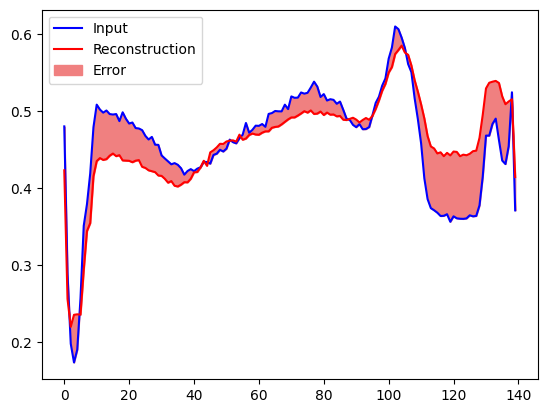

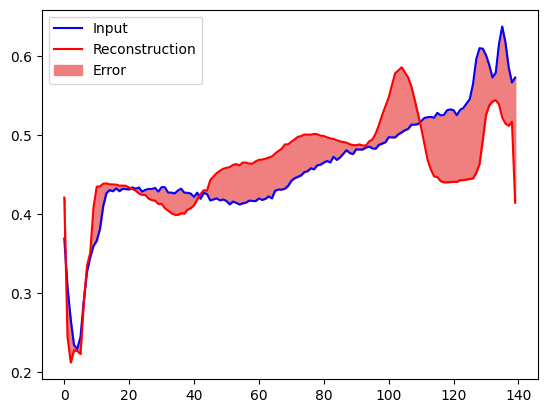

In [91]:
#Now let's define a function in order to plot the original ECG and reconstructed ones and also show the error
def plot(data, n):
  enc_img = autoencoder.encoder(data)
  dec_img = autoencoder.decoder(enc_img)
  plt.plot(data[n], 'b')
  plt.plot(dec_img[n], 'r')
  plt.fill_between(np.arange(140), data[n], dec_img[n], color = 'lightcoral')
  plt.legend(labels=['Input', 'Reconstruction', 'Error'])
  plt.show()

plot(n_test_data, 0)
plot(an_test_data, 0)

👉🏻 As I mentioned earlier an ECG is anomalous if it is greater than a threshold. We can set the threshold in any way we want. Here I am going to set it to one standard deviation from the mean of normal training data.

In [92]:
reconstructed = autoencoder(n_train_data)
train_loss = losses.mae(reconstructed, n_train_data)
t = np.mean(train_loss) + np.std(train_loss)

def prediction(model, data, threshold):
  rec = model(data)
  loss = losses.mae(rec, data)
  return tf.math.less(loss, threshold)
print(t)

0.033098478


In [93]:
pred = prediction(autoencoder, n_test_data, t)
print(pred)

tf.Tensor(
[False  True  True False  True  True  True False  True  True  True  True
  True  True  True  True  True  True  True  True False  True  True  True
  True  True  True  True  True  True  True  True  True  True False  True
  True  True  True False  True  True  True  True  True  True  True  True
  True  True  True  True False  True  True  True  True  True  True  True
  True  True  True  True False  True  True  True  True  True  True  True
  True  True  True  True  True  True  True False  True  True  True  True
 False  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True False  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True False  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True False  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  Tr

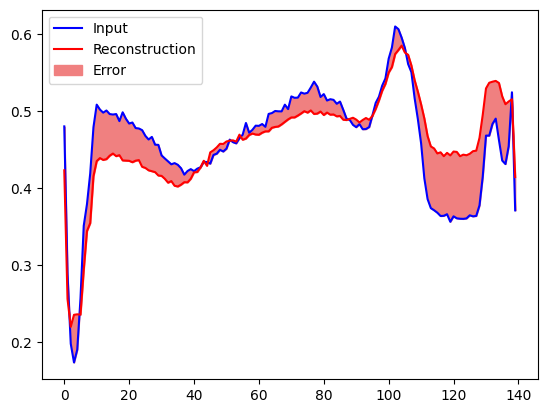

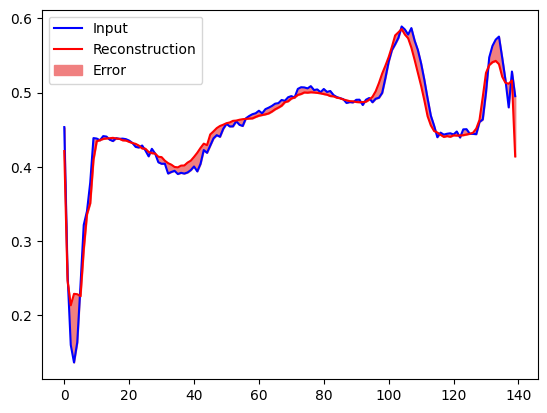

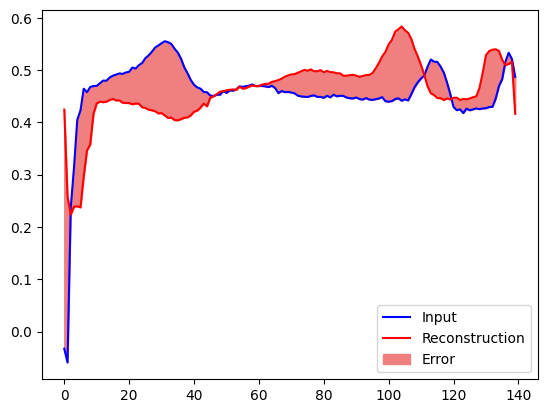

In [94]:
#Lets see some more result visually !!
plot(n_test_data, 0)
plot(n_test_data, 1)
plot(n_test_data, 3)

This model was just the basic model and it can be improved by doing hyperparameter tuning and making the encoder and decoder with DNN. 
The threshold was determined using a very simple method and it can be also changed for getting better and more accurate results. The criteria for determinig the threshold can make a lot of difference.

# 1.3 Accuracy 🎯

Out of **2359** Actual Shape of Prediction, **2240** were predicted correctly. 
This results in accuracy ≈ **94.96 %**


In [95]:
threshold = np.mean(train_loss) + 2*np.std(train_loss)
preds = tf.math.less(train_loss, threshold)
tf.math.count_nonzero(preds)

<tf.Tensor: shape=(), dtype=int64, numpy=2242>

In [96]:
preds.shape

TensorShape([2359])

In [97]:
acc = 2240/2359*100
print("Accuracy = ", acc, "%")

Accuracy =  94.95548961424333 %


<h2> 🕵🏻 Anomaly Detection: Expedia Hotel 🏨  </h2>

<img src="https://assets.materialup.com/uploads/132da5cf-4213-43fa-961a-b133e0b5f80d/preview.gif" height=98% width=98% style="margin-left:1%">

# 2️⃣ Problem Statement 2: Expedia Hotel 🏨

<img src="https://s27.q4cdn.com/708721433/files/images/new-logos/image-(10).png" height=50% width=50% style="margin-left:25%; display:inline;">

The [**Dataset**](https://www.kaggle.com/competitions/expedia-personalized-sort) is related to tourism sector and is multivariate, dependent on time series. The main objective here is to check and observe the hotel prices from the data set of expedia hotel search. I have implemented different models here to check the prices hikes and lows. 

[**Reference**](https://www.kaggle.com/code/bimimi/time-series-anomaly-detection)

In [98]:
import seaborn as sns 
import matplotlib.dates as md
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import host_subplot
import mpl_toolkits.axisartist as AA
import pandas as pd
plt.style.use(['default'])

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.covariance import EllipticEnvelope
from sklearn.ensemble import IsolationForest
from sklearn.svm import OneClassSVM
from mpl_toolkits.mplot3d import Axes3D

# !pip install pyemma
# from pyemma import msm
# %matplotlib inline

import os

for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

In [99]:
train = pd.read_csv('data/expedia-hotel/train.csv')

In [100]:
print(train.shape)
train.head()

(9917530, 54)


,srch_id,date_time,site_id,visitor_location_country_id,visitor_hist_starrating,visitor_hist_adr_usd,prop_country_id,prop_id,prop_starrating,prop_review_score,...,comp6_rate_percent_diff,comp7_rate,comp7_inv,comp7_rate_percent_diff,comp8_rate,comp8_inv,comp8_rate_percent_diff,click_bool,gross_bookings_usd,booking_bool
0,1,2013-04-04 08:32:15,12,187,NaN,NaN,219,893,3,3.5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,0,NaN,0
1,1,2013-04-04 08:32:15,12,187,NaN,NaN,219,10404,4,4.0,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,0,NaN,0
2,1,2013-04-04 08:32:15,12,187,NaN,NaN,219,21315,3,4.5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,0,NaN,0
3,1,2013-04-04 08:32:15,12,187,NaN,NaN,219,27348,2,4.0,...,NaN,NaN,NaN,NaN,-1.0,0.0,5.0,0,NaN,0
4,1,2013-04-04 08:32:15,12,187,NaN,NaN,219,29604,4,3.5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,0,NaN,0


In [101]:
train.isnull().sum()

srch_id                              0
date_time                            0
site_id                              0
visitor_location_country_id          0
visitor_hist_starrating        9412233
visitor_hist_adr_usd           9409918
prop_country_id                      0
prop_id                              0
prop_starrating                      0
prop_review_score                14630
prop_brand_bool                      0
prop_location_score1                 0
prop_location_score2           2178380
prop_log_historical_price            0
position                             0
price_usd                            0
promotion_flag                       0
srch_destination_id                  0
srch_length_of_stay                  0
srch_booking_window                  0
srch_adults_count                    0
srch_children_count                  0
srch_room_count                      0
srch_saturday_night_bool             0
srch_query_affinity_score      9281966
orig_destination_distance

<h2> Data Set : Expedia Hotel </h2>

<img src="https://cdn.dribbble.com/users/3195127/screenshots/15901369/dribbble_4x.png" height=98% width=98% style="margin-left:1%">

*“Hotel” refers to hotels, apartments, B&Bs, hostels and other properties appearing on Expedia’s websites.  Room types are not distinguished and the data can be assumed to apply to the least expensive room type. Most of the data are for searches that resulted in a purchase, but a small proportion are for searches not leading to a purchase. So, the main objective is to check the prices of Hotel Rooms.*

Selecting property / visitor location country / srch_room_count with the most Data Points 

In [102]:
# prop_id corresponding to 
train['prop_id'].value_counts()

prop_id
104517    4733
124342    4707
68420     4580
134154    4550
40279     4535
          ... 
115966       1
130054       1
131174       1
125775       1
102926       1
Name: count, Length: 136886, dtype: int64

In [103]:
train['visitor_location_country_id'].value_counts()

visitor_location_country_id
219    5778805
100     990487
55      580072
216     434568
220     350433
        ...   
144         31
198         30
146         30
24          29
8           27
Name: count, Length: 218, dtype: int64

In [104]:
# Num of rooms specified in search by customer
train['srch_room_count'].value_counts()

srch_room_count
1    9045780
2     734315
3      92372
4      25023
5       8053
8       4950
6       4345
7       2692
Name: count, dtype: int64

In [105]:
# Subset df 
df = train.loc[train['prop_id'] == 104517]

df = df.loc[df['visitor_location_country_id'] == 219]

df = df.loc[df['srch_room_count'] == 1]

# srch_saturday = if stay includes Sat night 
# srch_booking_window = num of days between search date and hotel stay start date 
df = df[['date_time', 'price_usd', 'srch_booking_window', 'srch_saturday_night_bool']]

In [106]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3049 entries, 2041 to 9917395
Data columns (total 4 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   date_time                 3049 non-null   object 
 1   price_usd                 3049 non-null   float64
 2   srch_booking_window       3049 non-null   int64  
 3   srch_saturday_night_bool  3049 non-null   int64  
dtypes: float64(1), int64(2), object(1)
memory usage: 119.1+ KB


In [107]:
df.describe()

,price_usd,srch_booking_window,srch_saturday_night_bool
count,3049.000000,3049.000000,3049.000000
mean,112.939023,37.082650,0.524434
std,113.374049,46.160272,0.499485
min,0.120000,0.000000,0.000000
25%,67.000000,6.000000,0.000000
50%,100.000000,20.000000,1.000000
75%,141.000000,48.000000,1.000000
max,5584.000000,292.000000,1.000000


In [108]:
train.loc[(train['price_usd'] == 5584) & 
         (train['visitor_location_country_id'] == 219)]

,srch_id,date_time,site_id,visitor_location_country_id,visitor_hist_starrating,visitor_hist_adr_usd,prop_country_id,prop_id,prop_starrating,prop_review_score,...,comp6_rate_percent_diff,comp7_rate,comp7_inv,comp7_rate_percent_diff,comp8_rate,comp8_inv,comp8_rate_percent_diff,click_bool,gross_bookings_usd,booking_bool
2905344,195154,2013-04-07 20:59:07,5,219,NaN,NaN,219,104517,4,4.0,...,NaN,NaN,NaN,NaN,-1.0,0.0,28.0,0,NaN,0


👉🏻 Possible wrong search, no intention to book

In [109]:
# Removing 5584 
df = df.loc[df['price_usd'] < 5584]
df['price_usd'].describe()

count    3048.000000
mean      111.144055
std        55.055161
min         0.120000
25%        67.000000
50%       100.000000
75%       141.000000
max       536.000000
Name: price_usd, dtype: float64

In [110]:
df['date_time'].min(), df['date_time'].max()

('2012-11-01 02:48:30', '2013-06-30 22:50:21')

In [111]:
df['date_time']

2041       2013-03-14 11:27:28
3152       2013-01-03 20:48:24
5166       2013-01-19 16:51:27
10135      2013-01-26 11:34:23
10560      2013-04-29 09:39:50
                  ...         
9908584    2013-01-02 19:36:56
9911528    2013-02-23 12:27:10
9915868    2012-11-17 17:53:21
9916580    2013-04-26 18:52:31
9917395    2013-02-23 11:03:49
Name: date_time, Length: 3048, dtype: object

In [112]:
pd.to_datetime(df['date_time'])

2041      2013-03-14 11:27:28
3152      2013-01-03 20:48:24
5166      2013-01-19 16:51:27
10135     2013-01-26 11:34:23
10560     2013-04-29 09:39:50
                  ...        
9908584   2013-01-02 19:36:56
9911528   2013-02-23 12:27:10
9915868   2012-11-17 17:53:21
9916580   2013-04-26 18:52:31
9917395   2013-02-23 11:03:49
Name: date_time, Length: 3048, dtype: datetime64[ns]

In [113]:
df['date_time'].describe()

df['date_time'] = pd.to_datetime(df['date_time'])

df.head()

,date_time,price_usd,srch_booking_window,srch_saturday_night_bool
2041,2013-03-14 11:27:28,206.0,99,1
3152,2013-01-03 20:48:24,186.0,6,0
5166,2013-01-19 16:51:27,61.0,1,0
10135,2013-01-26 11:34:23,72.0,116,0
10560,2013-04-29 09:39:50,246.0,245,0


In [114]:
import matplotlib.pyplot as plt
import plotly.express as px

In [115]:
fig = px.scatter(df, x=df.columns[0], y=df.columns[1], height=500, width=1200, template='plotly_white')
fig.update_layout(
    title="Time series of room price by date of search",
    yaxis_title="USD",
    xaxis_title="Dates",
    )

In [116]:
df.head()

,date_time,price_usd,srch_booking_window,srch_saturday_night_bool
2041,2013-03-14 11:27:28,206.0,99,1
3152,2013-01-03 20:48:24,186.0,6,0
5166,2013-01-19 16:51:27,61.0,1,0
10135,2013-01-26 11:34:23,72.0,116,0
10560,2013-04-29 09:39:50,246.0,245,0


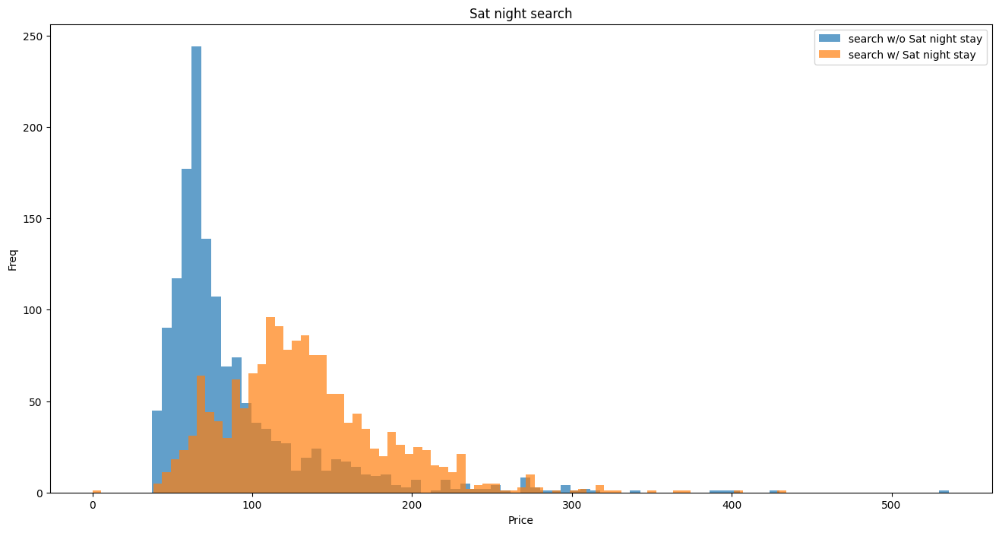

In [117]:
a = df.loc[df['srch_saturday_night_bool'] == 0, 'price_usd']
b = df.loc[df['srch_saturday_night_bool'] == 1, 'price_usd']

plt.figure(figsize = (16, 8))

plt.hist(a, bins = 80, 
         alpha = 0.7, 
         label = 'search w/o Sat night stay')

plt.hist(b, bins = 80, 
         alpha = 0.7, 
         label = 'search w/ Sat night stay')

plt.xlabel('Price')
plt.ylabel('Freq')
plt.legend()
plt.title('Sat night search')
plt.plot();

In [118]:
df['srch_saturday_night_bool'].value_counts()

srch_saturday_night_bool
1    1599
0    1449
Name: count, dtype: int64

In [119]:
print('Kurtosis: %f' % df['price_usd'].kurt())
print('Skewness: %f' % df['price_usd'].skew())

Kurtosis: 3.617559
Skewness: 1.443641


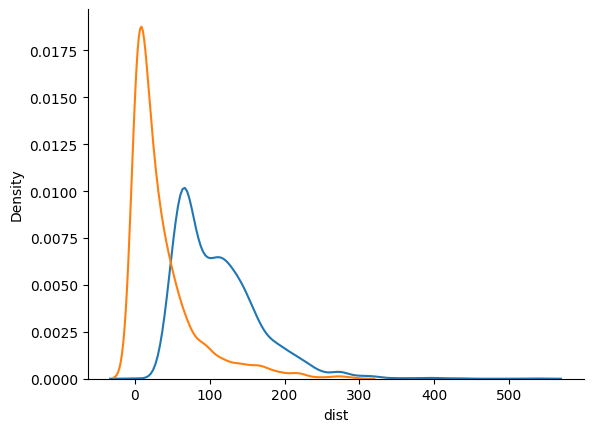

In [120]:
plt.style.use(['default']) 
sns.distplot(df['price_usd'], 
                 hist = False, label = 'USD')

sns.distplot(df['srch_booking_window'], 
                  hist = False, label = 'booking window')

plt.xlabel('dist')
sns.despine()

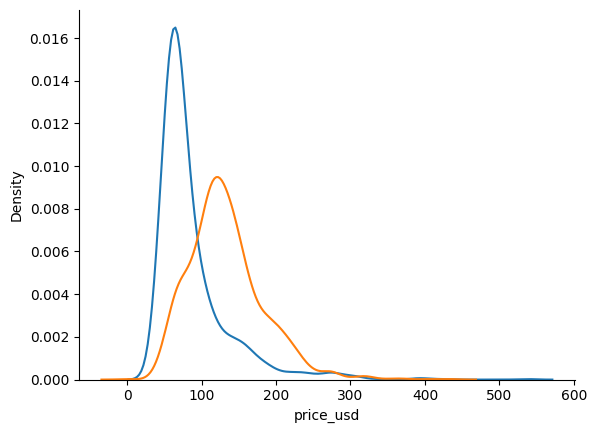

In [121]:
sns.distplot(a, hist = False, rug = False)
sns.distplot(b, hist = False, rug = False)

sns.despine()

In [122]:
import numpy as np
df = df.sort_values('date_time')
df['date_time_int'] = df.date_time.astype('int64')
df['date_time_int']

3945840    1351738110000000000
63387      1351739203000000000
3352426    1351760658000000000
5257418    1351761063000000000
7091061    1351764925000000000
                  ...         
2792991    1372575836000000000
9363497    1372606952000000000
143486     1372610620000000000
2478763    1372622832000000000
3800163    1372632621000000000
Name: date_time_int, Length: 3048, dtype: int64

<h2> Cluster-based models </h2>

* K-Means
* Isolation forest
* Clustering

<h3>Potential outliers</h3>

* usd
* srch_booking_window (days between search and first stay date)
* srch_saturday (stay includes sat night

# 2.1 K-Means

This method looks at the data points in a dataset and groups those that are similar into a predefined number K of clusters. A threshold value can be added to detect anomalies: if the distance between a data point and its nearest centroid is greater than the threshold value, then it is an anomaly.

<img src="https://www.gatevidyalay.com/wp-content/uploads/2020/01/K-Means-Clustering.png" height=80% width=80% style="margin-left:10%">

In [123]:
# Determine optimal cluster num using elbow method 
data = df[['price_usd', 'srch_booking_window', 'srch_saturday_night_bool']]
n_cluster = range(1, 20)

kmeans = [KMeans(n_clusters = i).fit(data) for i in n_cluster]
scores = [kmeans[i].score(data) for i in range(len(kmeans))]

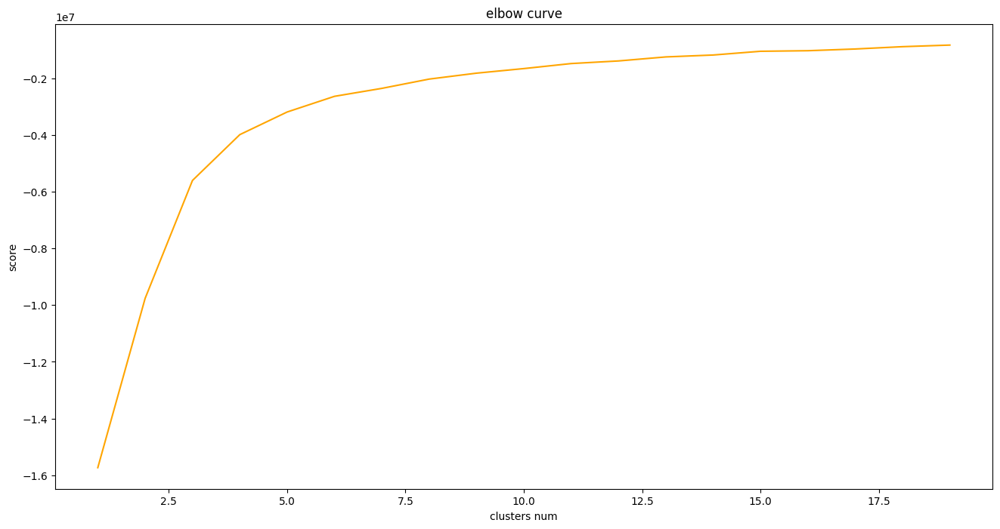

In [124]:
# elbow curve 
fig, ax = plt.subplots(figsize = (16, 8))
ax.plot(n_cluster, scores, color = 'orange')

plt.xlabel('clusters num')
plt.ylabel('score')
plt.title('elbow curve')
plt.show();

👉🏻 Setting n_clusters to 7

> n_clusters > 7 = additional clusters do not explain greater variance in variable 
> 
> *where **variable = price_usd**.*

In [125]:
# k means output 
X = df[['price_usd', 'srch_booking_window', 'srch_saturday_night_bool']]
X = X.reset_index(drop = True)

km = KMeans(n_clusters = 7)
km.fit(X)
km.predict(X)

labels = km.labels_

X.head()

,price_usd,srch_booking_window,srch_saturday_night_bool
0,84.0,19,0
1,78.0,16,1
2,114.0,56,1
3,76.0,56,1
4,128.0,0,1


In [126]:
X["Cluster"] = labels
X

,price_usd,srch_booking_window,srch_saturday_night_bool,Cluster
0,84.0,19,0,3
1,78.0,16,1,3
2,114.0,56,1,6
3,76.0,56,1,6
4,128.0,0,1,0
...,...,...,...,...
3043,152.0,11,1,5
3044,56.0,172,1,1
3045,68.0,8,0,3
3046,169.0,27,1,5


# 2.2 3D Clusters 
Plotting using K-Means O/P 

In [127]:
from src.analysis import plotters

# 颜色映射，根据实际聚类的数量可以修改
color_mapping = {
    0: "red", 1: "green", 2: "blue", 3: "yellow",
    4: "purple", 5: "orange", 6: "black"
}

# 将每个聚类标签映射到一个颜色
colors = [color_mapping[cluster] for cluster in X["Cluster"]]

plotters.plot_3d_scatter(
    x=X["price_usd"],
    y=X["srch_booking_window"],
    z=X["srch_saturday_night_bool"],
    hover_text=X["Cluster"].tolist(),
    color_list=colors,
    title= "3 Component PCA",
    camera_pos = {"x": 0.5, "y": 1, "z": 1}
)

In [128]:
import plotly.express as px

fig = px.scatter_3d(X, x='price_usd', y='srch_booking_window', z='srch_saturday_night_bool',
              color='Cluster')
fig.show()

pca 异常检测的例子

PCA异常检测的逻辑
重构误差：当数据通过PCA被压缩到主成分后，然后又被重构回原来的维度时，将会产生一些误差。这种误差称为重构误差，它基本上衡量了数据点与PCA模型的适应度。如果一个数据点很好地适应了模型（即在主成分定义的子空间中），那么其重构误差应该比较低。

异常检测：重构误差较高的数据点可能表明它们不符合数据的主要趋势和结构。因此，这些数据点可能是异常的，因为它们不能被PCA模型中的主要成分所很好地表示。

设置阈值
阈值的确定：通常，阈值是基于重构误差的分布来确定的。选择95%百分位数意味着，我们将允许5%的数据点被视为异常。这些点的重构误差高于95%的其他数据点的重构误差。
为什么是95%：这个阈值不是固定的，而是可以根据具体的应用和对异常检测敏感性的需求来调整。95%是一个常见的选择，因为它提供了一个相对严格的标准，但同时避免了将太多的正常数据误分类为异常。

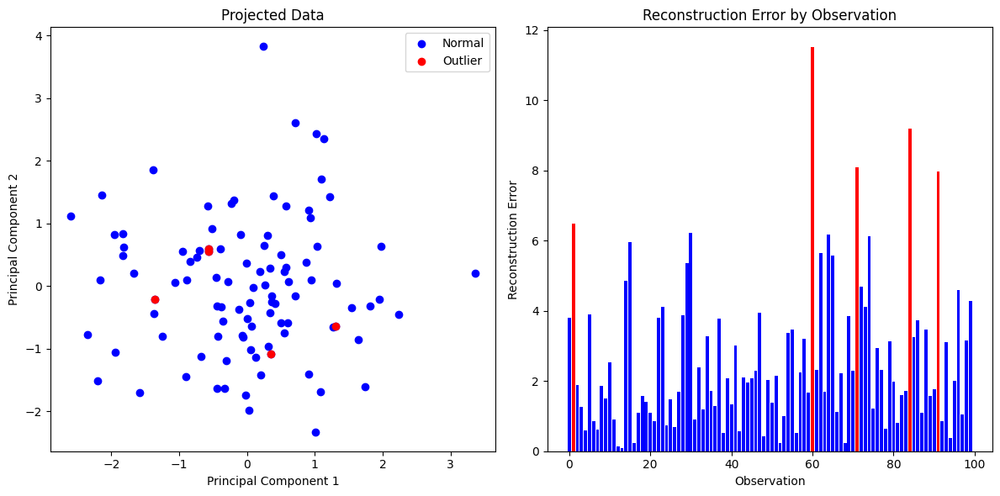

Reconstruction error: [ 3.7911034   6.49464587  1.87799868  1.26621247  0.59204335  3.89571909
  0.85042552  0.61084528  1.87135888  1.49638359  2.53943672  0.91533827
  0.13979625  0.09245408  4.86394317  5.96538444  0.24425115  1.0896504
  1.58257526  1.41836734  1.08945828  0.86515221  3.79831011  4.12517792
  0.73788622  1.48127554  0.6994028   1.70378853  3.8711495   5.3653281
  6.21350682  0.89969119  2.39748873  1.2015869   3.27881821  1.72333517
  1.29119666  3.7662234   0.53211156  2.07051893  1.33083755  3.00480613
  0.56013221  2.10952402  1.9549264   2.06542904  2.2840912   3.95570685
  0.43143032  2.04027108  1.3833085   2.15998642  0.2412585   1.0011954
  3.3615319   3.46247204  0.52839811  2.24982511  3.20045285  1.67232051
 11.50709909  2.30764427  5.63768298  1.69754245  6.16694628  5.56568183
  1.12144372  2.2299576   0.2434963   3.84203372  2.29908934  8.0824526
  4.68802223  4.12000316  6.116234    1.2102599   2.93235621  2.30895709
  0.64902087  3.12205028  1.98454

In [129]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# 示例数据
data = np.random.randn(100, 5)  # 100个样本，5个特征
'''
[[-1.48187827e-01 -1.75668870e-01  6.83403529e-02 -9.59258255e-01
  -1.06998865e-01]
 [-1.20671500e+00 -2.71626282e+00 -5.73575246e-01  1.06723512e+00
  -1.07234300e+00]
'''

# 步骤1: 数据标准化
scaler = StandardScaler()
data_normalized = scaler.fit_transform(data)

# 步骤2, 3, 4: 应用PCA
pca = PCA(n_components=2)  # 使用两个主成分
pca.fit(data_normalized)

# 步骤5: 投影数据到主成分
data_projected = pca.transform(data_normalized)

# 步骤6: 重构原始数据并计算重构误差
data_reconstructed = pca.inverse_transform(data_projected)
reconstruction_error = np.sum((data_normalized - data_reconstructed) ** 2, axis=1)

# 步骤7: 确定异常阈值和标记异常
threshold = np.percentile(reconstruction_error, 95)  # 设置95%的阈值
outliers = reconstruction_error > threshold

# 绘图展示
plt.figure(figsize=(12, 6))

# 绘制原始数据投影
plt.subplot(1, 2, 1)
plt.scatter(data_projected[:, 0], data_projected[:, 1], c='blue', label='Normal')
plt.scatter(data_projected[outliers, 0], data_projected[outliers, 1], c='red', label='Outlier')
plt.title('Projected Data')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()

# 绘制重构误差
plt.subplot(1, 2, 2)
plt.bar(range(len(reconstruction_error)), reconstruction_error, color='blue')
plt.bar(np.where(outliers)[0], reconstruction_error[outliers], color='red')
plt.title('Reconstruction Error by Observation')
plt.xlabel('Observation')
plt.ylabel('Reconstruction Error')

plt.tight_layout()
plt.show()

print("Reconstruction error:", reconstruction_error)
print("Outliers detected:", outliers)


In [130]:
import pylab as pl 

# 2.3 PCA 

The PCA-Based Anomaly Detection component solves the problem by analyzing available features to determine what constitutes a "normal" class. The component then applies distance metrics to identify cases that represent anomalies. This approach lets you train a model by using existing imbalanced data.

<img src="https://static-02.hindawi.com/articles/scn/volume-2021/7389943/figures/7389943.fig.005.jpg" height=80% width=80% style="margin-left:10%">

In [131]:
data = df[['price_usd', 'srch_booking_window', 'srch_saturday_night_bool']]

X = data.values
"""
array([[ 84.,  19.,   0.],
    [ 78.,  16.,   1.],
    [114.,  56.,   1.],
"""
# 1. Standardize the data
X_std = StandardScaler().fit_transform(X)

# 2. Calc eigenvec cor & eig_vals of covar matrix 
mean_vec = np.mean(X_std, axis = 0)

cov_mat = np.cov(X_std.T)

eig_vals, eig_vecs = np.linalg.eig(cov_mat)

# eig_val,eig_vecs tuple
eig_pairs = [(np.abs(eig_vals[i]), eig_vecs[:,i]) for i in range(len(eig_vals))]

eig_pairs.sort(key = lambda x: x[0], reverse = True)

In [132]:
# Calc explained var from eig_vals 
total = sum(eig_vals)

# Individual explained var 
var_exp = [(i/total)*100 for i in sorted(eig_vals, reverse = True)]

# Cumulative explained var 
cum_var_exp = np.cumsum(var_exp)
print("Cumulative explained variance: ", cum_var_exp)

Cumulative explained variance:  [ 47.10123543  80.66253687 100.        ]


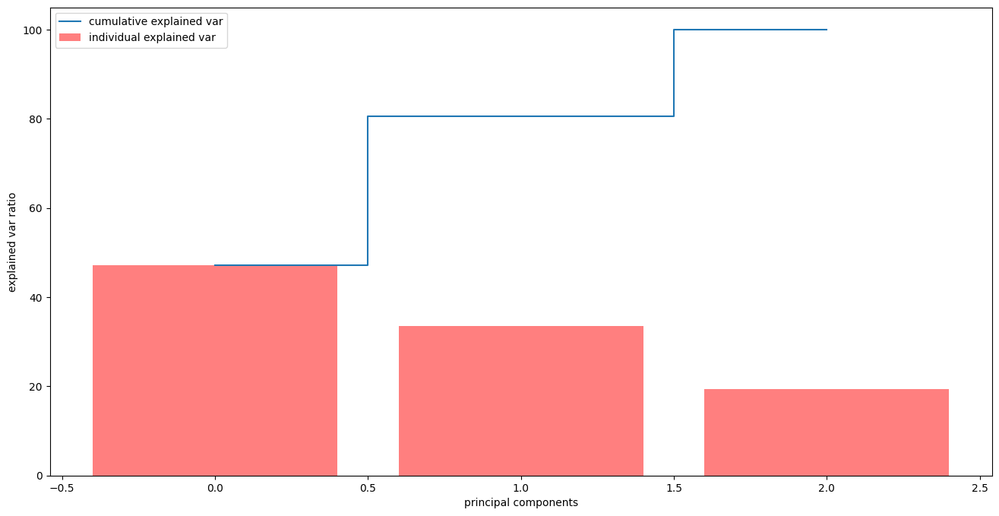

In [133]:
plt.figure(figsize = (16, 8))
plt.bar(range(len(var_exp)), var_exp, 
        alpha = 0.5, align = 'center', 
        label = 'individual explained var', 
        color = 'r'
       )

plt.step(range(len(cum_var_exp)), cum_var_exp,
         where = 'mid',
         label = 'cumulative explained var')

plt.xlabel('principal components')
plt.ylabel('explained var ratio')
plt.legend(loc = 'best')
plt.show();

👉🏻 Component 

> **1** = explains approx 50% of var
> 
> **2** = explains < 40
> 
> **3** = explains < 20 

Components 1 + 2 = explain approx 80% of var 

* set n_components = 2

* standardize features 

## pandas中一个方括号和两个方括号的区别

一个方括号返回的是一个Series，两个方括号返回的是一个DataFrame。

In [134]:
import pandas as pd

test = False
if test:
    # 创建一个示例DataFrame
    data = {
        'price_usd': [200, 150, 120, 180, 220],
        'srch_booking_window': [14, 3, 20, 1, 5],
        'srch_saturday_night_bool': [True, False, True, False, True],
        'other_info': [1, 2, 3, 4, 5]  # 一个额外的列，我们不会在选择中包括它
    }

    df = pd.DataFrame(data)

    # 使用单个方括号选择单列
    selected_column = df['price_usd']
    print("单个方括号返回的是series: \n", selected_column)

    # 使用双方括号选择多列
    selected_columns = df[['price_usd', 'srch_booking_window', 'srch_saturday_night_bool']]
    print("\n双方括号返回的是dataframe：\n", selected_columns)

In [135]:
data = df[['price_usd', 'srch_booking_window', 'srch_saturday_night_bool']]
data

,price_usd,srch_booking_window,srch_saturday_night_bool
3945840,84.0,19,0
63387,78.0,16,1
3352426,114.0,56,1
5257418,76.0,56,1
7091061,128.0,0,1
...,...,...,...
2792991,152.0,11,1
9363497,56.0,172,1
143486,68.0,8,0
2478763,169.0,27,1


In [136]:
data = df[['price_usd', 'srch_booking_window', 'srch_saturday_night_bool']]

# 1. Standardize features
X_std = StandardScaler().fit_transform(X)
data = pd.DataFrame(X_std)
data_normalized = data

# 2. Reduce components to 2 and 投影数据到主成分
pca = PCA(n_components = 2)
data = pca.fit_transform(data)
data_projected = data

# 3. Standardize 2 new features 
'''
在第三步中，
已经通过PCA转换的数据被再次标准化。

具体来说，这一步骤主要目的是：

确保主成分的标准化：虽然PCA的输入数据（原始特征）在进行PCA之前已经标准化过，
但PCA转换后的输出（即主成分得分）不一定是标准化的。
主成分是数据的一个线性组合，这些组合的尺度（均值和方差）可能与原始标准化的特征不同。

均一化数据处理：
再次标准化可以确保所有主成分都具有相同的尺度（即均值为0，标准差为1）。
这对于后续的数据处理和分析非常重要，尤其是在应用机器学习算法时，这些算法往往对输入数据的尺度非常敏感。

增强模型性能：
对于某些特定的分析和算法（比如聚类、基于距离的异常检测等），
确保所有特征具有相同的重要性（无量纲化）是提高模型性能的关键。
'''
scaler = StandardScaler()
np_scaled = scaler.fit_transform(data)
data = pd.DataFrame(np_scaled)

### 重构数据检测异常值 方法1


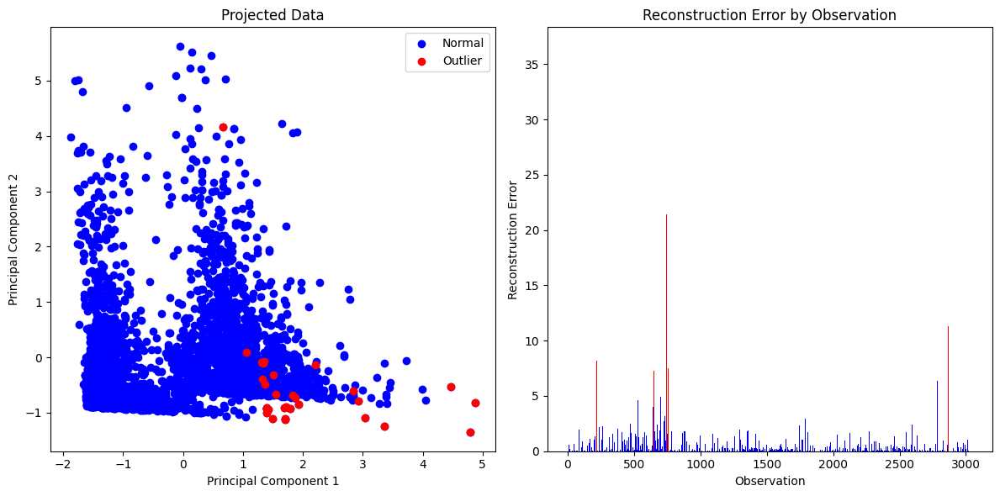

anomaly_df (31, 2)


In [103]:

# 步骤6: 重构原始数据并计算重构误差
data_reconstructed = pca.inverse_transform(data_projected)
reconstruction_error = np.sum((data_normalized - data_reconstructed) ** 2, axis=1)

# 步骤7: 确定异常阈值和标记异常
threshold = np.percentile(reconstruction_error, 99)  # 设置95%的阈值
outliers = reconstruction_error > threshold
'''
Outliers detected: 
0       False
1       False
2       False
3       False
4       False
        ...  
3043    False
3044    False
3045    False
3046    False
3047    False
Length: 3048, dtype: bool
'''

# 绘图展示
plt.figure(figsize=(12, 6))

# 绘制原始数据投影
plt.subplot(1, 2, 1)
plt.scatter(data_projected[:, 0], data_projected[:, 1], c='blue', label='Normal')
plt.scatter(data_projected[outliers, 0], data_projected[outliers, 1], c='red', label='Outlier')
plt.title('Projected Data')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()

# 绘制重构误差
plt.subplot(1, 2, 2)
plt.bar(range(len(reconstruction_error)), reconstruction_error, color='blue')
plt.bar(np.where(outliers)[0], reconstruction_error[outliers], color='red')
plt.title('Reconstruction Error by Observation')
plt.xlabel('Observation')
plt.ylabel('Reconstruction Error')

plt.tight_layout()
plt.show()

df_anomaly = df.copy()
df_anomaly['anomaly'] = outliers
anomaly_df = df_anomaly.loc[df_anomaly['anomaly'] == True, ['date_time_int', 'price_usd']]
print("anomaly_df", anomaly_df.shape)

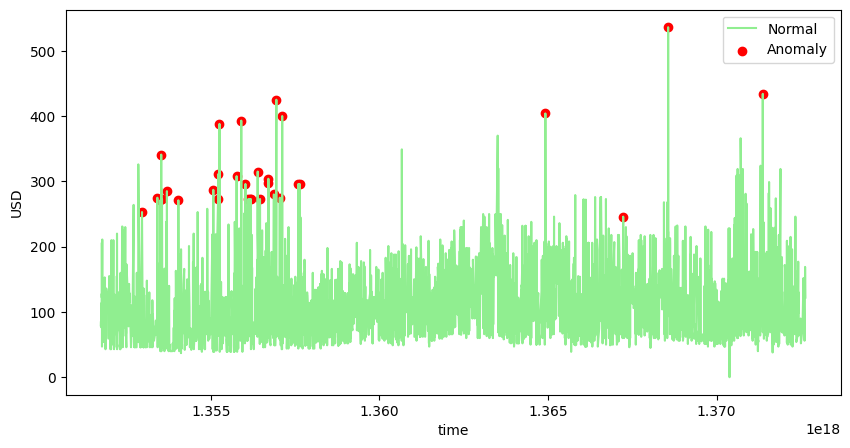

In [109]:
fig, ax = plt.subplots(figsize = (10, 5))

ax.plot(df['date_time_int'], df['price_usd'], 
        color = 'lightgreen', label = 'Normal')

a = df.loc[df_anomaly['anomaly'] == 1, 
           ['date_time_int', 'price_usd']]
ax.scatter(a['date_time_int'], a['price_usd'],
           color = 'red', label = 'Anomaly')

plt.xlabel('time')
plt.ylabel('USD')
plt.legend()
plt.show()

In [120]:
df_anomaly['anomaly'].value_counts()

anomaly
False    3017
True       31
Name: count, dtype: int64

### 重构数据检测异常值 方法2

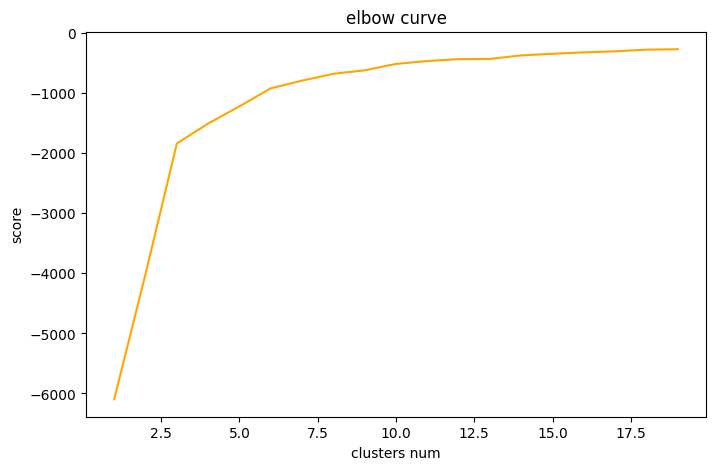

In [137]:
# 对于标准化后的新投影空间的数据进行聚类
kmeans = [KMeans(n_clusters = i).fit(data) for i in n_cluster]
scores = [kmeans[i].score(data) for i in range(len(kmeans))]

# elbow curve 
fig, ax = plt.subplots(figsize = (8, 5))
ax.plot(n_cluster, scores, color = 'orange')

plt.xlabel('clusters num')
plt.ylabel('score')
plt.title('elbow curve')
plt.show()

In [138]:
df

,date_time,price_usd,srch_booking_window,srch_saturday_night_bool,date_time_int
3945840,2012-11-01 02:48:30,84.0,19,0,1351738110000000000
63387,2012-11-01 03:06:43,78.0,16,1,1351739203000000000
3352426,2012-11-01 09:04:18,114.0,56,1,1351760658000000000
5257418,2012-11-01 09:11:03,76.0,56,1,1351761063000000000
7091061,2012-11-01 10:15:25,128.0,0,1,1351764925000000000
...,...,...,...,...,...
2792991,2013-06-30 07:03:56,152.0,11,1,1372575836000000000
9363497,2013-06-30 15:42:32,56.0,172,1,1372606952000000000
143486,2013-06-30 16:43:40,68.0,8,0,1372610620000000000
2478763,2013-06-30 20:07:12,169.0,27,1,1372622832000000000


In [139]:
data

,0,1
0,-0.889864,-0.521900
1,0.230566,-0.272218
2,0.567439,0.546642
3,0.155659,0.581776
4,0.793675,-0.659305
...,...,...
3043,1.039107,-0.447155
3044,-0.215446,3.071488
3045,-1.048605,-0.741446
3046,1.202030,-0.122015


In [140]:
# 因为上面已经知道7是最佳聚类数，所以这里直接取7
df['cluster'] = kmeans[7].predict(data)
# data现在是投影到新空间的数据，而且进行了标准化
# df是原始数据
# 下面的代码是将聚类结果映射到原始数据上，因为添加了新的cluster列，
# 所以需要将新的cluster列映射到原始数据上。
df.index = data.index

df['pc1'] = data[0]
df['pc2'] = data[1]
df['cluster'].value_counts()

cluster
0    786
6    712
2    444
1    394
4    352
5    150
7    124
3     86
Name: count, dtype: int64

In [89]:
def getDistanceByPoint(data, model):
    distance = pd.Series()
    for i in range(0,len(data)):
        Xa = np.array(data.loc[i])
        Xb = model.cluster_centers_[model.labels_[i]]
        distance.at[i] = np.linalg.norm(Xa-Xb)
    return distance

# 异常值比例
outliers_fraction = 0.01

distance = getDistanceByPoint(data, kmeans[7])
'''
0       0.196265
1       0.244399
2       0.172127
3       0.552738
4       0.447390
          ...   
3043    0.439126
3044    0.646786
3045    0.074989
3046    0.428241
3047    0.392277
Length: 3048, dtype: float64
'''
# 根据设定的异常比例计算出应该标记为异常的数据点的数量。
outlier_num = int(outliers_fraction * len(distance))
# 确定将数据点标记为异常的距离阈值。这一步通过选取最大的 outlier_num 个
# 距离中的最小值来实现，即距离最大的1%中的最小值成为阈值。
threshold = distance.nlargest(outlier_num).min()

df['anomaly'] = (distance >= threshold).astype(int)
df.anomaly.value_counts()

anomaly
0    3018
1      30
Name: count, dtype: int64

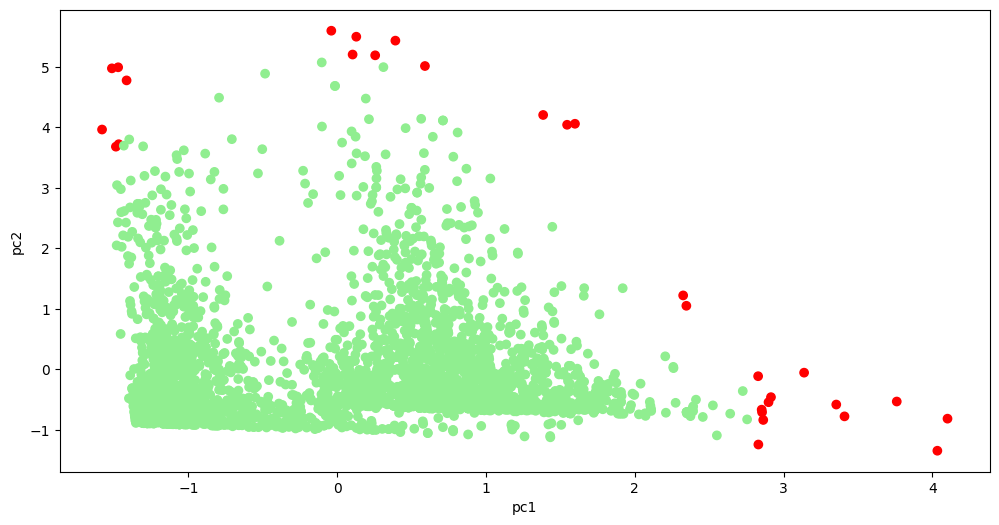

In [90]:
fig, ax = plt.subplots(figsize = (12, 6))

colors = {0:'lightgreen', 1:'red'}

ax.scatter(df['pc1'], df['pc2'], 
           c = df['anomaly'].apply(lambda x: colors[x]))

plt.xlabel('pc1')
plt.ylabel('pc2')
plt.show();

In [91]:
df = df.sort_values('date_time')
df['date_time'] = df.date_time.astype(np.int64)

# object with anomalies
a = df.loc[df['anomaly'] == 1, 
           ['date_time_int', 'price_usd']]

a

,date_time_int,price_usd
8,1351779652000000000,211.0
96,1352380267000000000,230.0
102,1352416996000000000,225.0
151,1352847902000000000,326.0
416,1354869170000000000,126.0
745,1356942326000000000,425.0
946,1358170816000000000,55.0
997,1358406730000000000,53.0
1005,1358444151000000000,102.0
1140,1359377578000000000,87.0


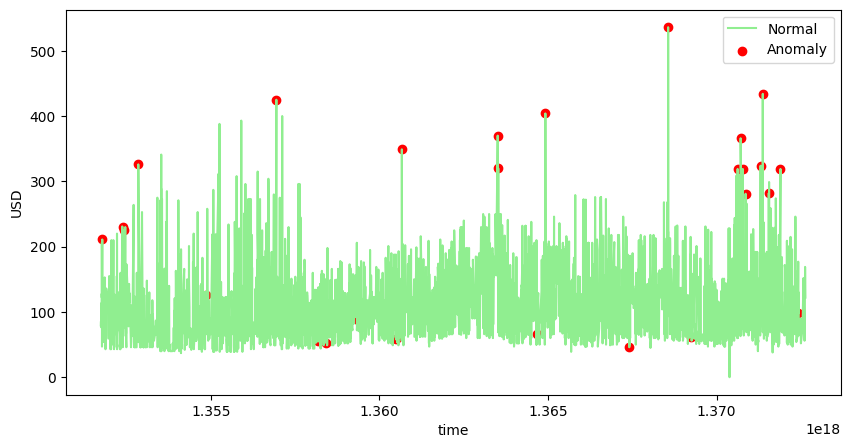

In [92]:
fig, ax = plt.subplots(figsize = (10, 5))

ax.plot(df['date_time_int'], df['price_usd'], 
        color = 'lightgreen', label = 'Normal')

ax.scatter(a['date_time_int'], a['price_usd'],
           color = 'red', label = 'Anomaly')

plt.xlabel('time')
plt.ylabel('USD')
plt.legend()
plt.show();

In [93]:
df['anomaly'].unique()

array([0, 1])

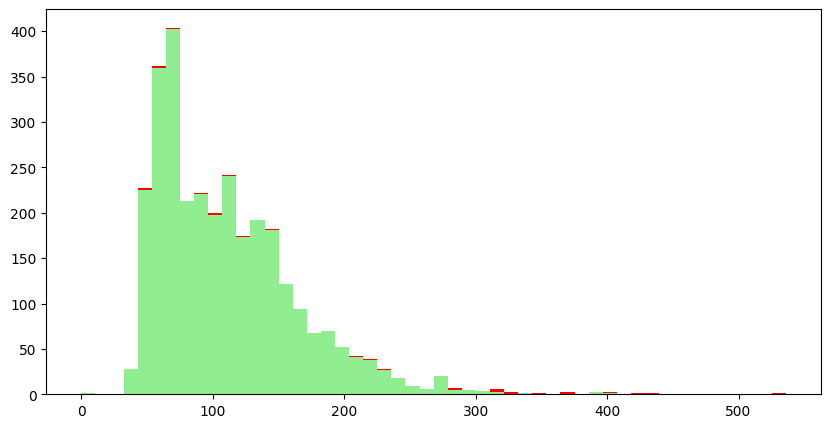

In [94]:
a = df.loc[df['anomaly'] == 0, 'price_usd']
b = df.loc[df['anomaly'] == 1, 'price_usd']

fig, axs = plt.subplots(figsize = (10, 5))
axs.hist([a, b], 
         bins = 50, stacked = True, 
         color = ['lightgreen', 'red'])

plt.show();

In [85]:
df.anomaly.value_counts()

anomaly
0    3018
1      30
Name: count, dtype: int64

# 2.4 Isolation Forest

Detect anomalies based on data points that are few and different 

- No use of density / distance measure 
    i.e. different from clustering based / distanced based algorithms 

- Randomly select a feature 
    
- Randomly select a split between max and min values of selected feature 
    
- Length of path, avged over a forest of random trees = measure of normality 

- Random partitioning = shorter path for anomalies

- If forest produces shorter paths for samples, then they are likely to be anomalies 

In Isolation forest on the left.. we can isolate an anomalous point from the rest of the data with just one line, while the normal point on the right requires four lines to isolate completely.

<img src="https://miro.medium.com/max/1400/1*6GFMewU1Aax57nsW2uSakQ.png" height=80% width=80% style="margin-left:10%">

Isolation Forest Algorithm takes advantage of the following properties of anomalous samples - 

> Fewness — anomalous samples are a minority and there will only be a few of them in any dataset.
> 
> Different — anomalous samples have values/attributes that are very different from those of normal samples.
> 

<img src="https://engineering.linkedin.com/content/dam/engineering/site-assets/images/blog/posts/2019/08/IsolationForest1.png" height=70% width=70% style="margin-left:15%">

We can see, Outliers are easier to isolate, while Inliers are harders to isolate..

异常值更容易隔离，而内值更难隔离。

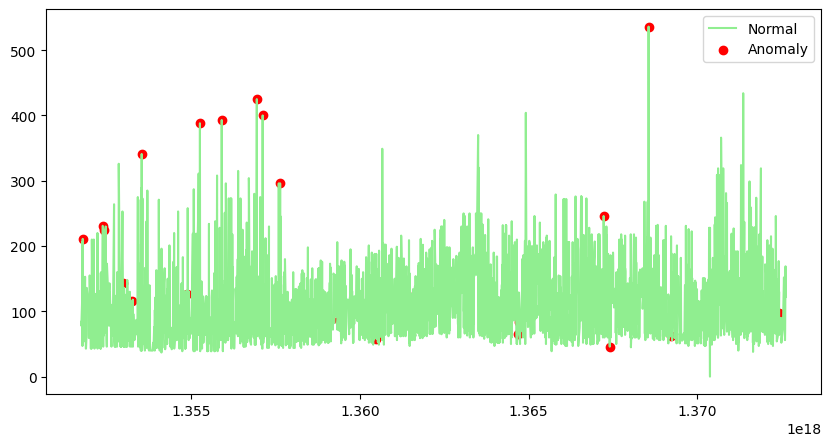

In [112]:
data = df[['price_usd', 'srch_booking_window', 'srch_saturday_night_bool']]

# 1. Standardize features
scaler = StandardScaler()
np_scaled = scaler.fit_transform(data)

data = pd.DataFrame(np_scaled)

# 2. Isolation forest 
outliers_fraction = 0.01
# ifo is the isolation forest model
ifo = IsolationForest(contamination = outliers_fraction)
ifo.fit(data)

# Predict the anomaly score
# add the data to the main df
# Anomaly point is marked as -1, and normal point is marked as 1
df['anomaly1'] = pd.Series(ifo.predict(data))

# visualization
fig, ax = plt.subplots(figsize = (10, 5))
a = df.loc[df['anomaly1'] == -1, ['date_time_int', 'price_usd']]

ax.plot(df['date_time_int'], df['price_usd'], 
        color = 'lightgreen', label = 'Normal')
ax.scatter(a['date_time_int'], a['price_usd'], 
           color = 'red', label = 'Anomaly')

plt.legend()
plt.show();

In [113]:
df['anomaly1'].unique()

array([ 1, -1])

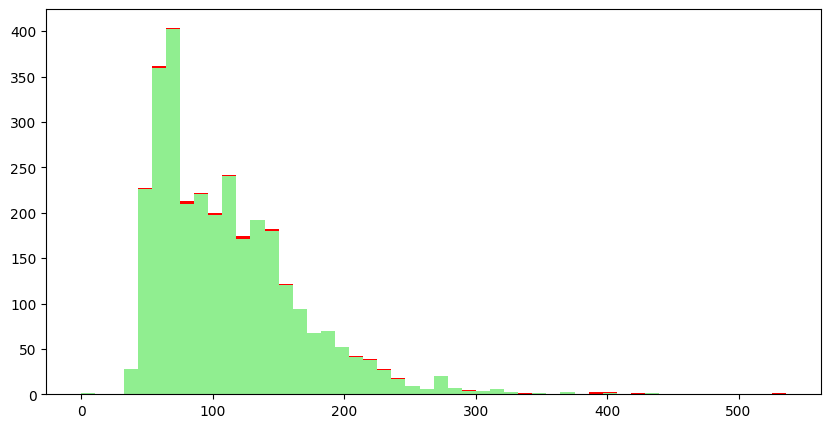

In [114]:
a = df.loc[df['anomaly1'] == 1, 'price_usd']
b = df.loc[df['anomaly1'] == -1, 'price_usd']

fig, ax = plt.subplots(figsize = (10, 5))

ax.hist([a, b],
        bins = 50, stacked = True, 
        color = ['lightgreen', 'red'] )

plt.show();

In [119]:
df['anomaly1'].value_counts()

anomaly1
 1    3017
-1      31
Name: count, dtype: int64

<h2> Support vector machine models </h2>

Associated with supervised learning 
- One class SVM
- Gaussian distribution 
- Markov chain

<img src="https://documentation.mindsphere.io/MindSphere/apis/analytics-anomalydetection/images/DBSCAN.png" height=70% width=70% style="margin-left:15%">

# 2.5 One class SVM 
- Unsupervised Anomaly Detection Method
- Estimate support of high dimensional distribution

In [115]:
data = df[['price_usd', 'srch_booking_window', 'srch_saturday_night_bool']]
scaler = StandardScaler()
np_scaled = scaler.fit_transform(data)

data = pd.DataFrame(np_scaled)

# Train 
# outliers_fraction is the percentage of outliers in the data
# is defined as 1% in this case
osvm = OneClassSVM(nu = outliers_fraction, 
                   kernel = 'rbf', 
                   gamma = 0.01)

osvm.fit(data)

df['anomaly2'] = pd.Series(osvm.predict(data))

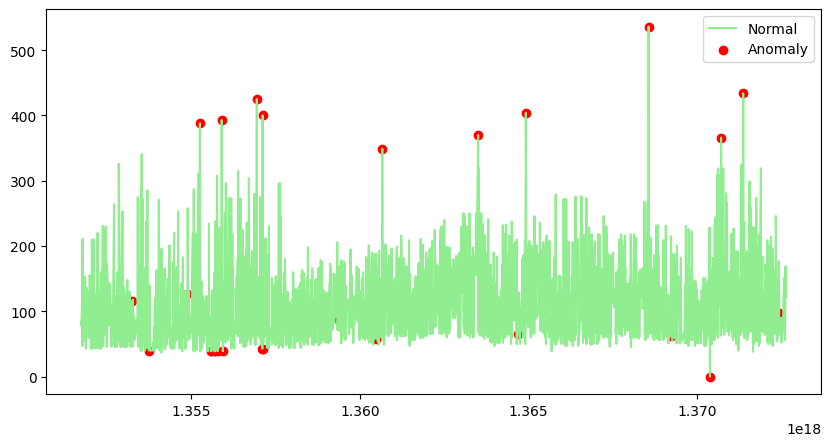

In [116]:
fig, ax = plt.subplots(figsize = (10, 5))

a = df.loc[df['anomaly2'] == -1, ['date_time_int', 'price_usd']]

ax.plot(df['date_time_int'], df['price_usd'], color = 'lightgreen', label = 'Normal')
ax.scatter(a['date_time_int'], a['price_usd'], color = 'red', label = 'Anomaly')

plt.legend()
plt.show();

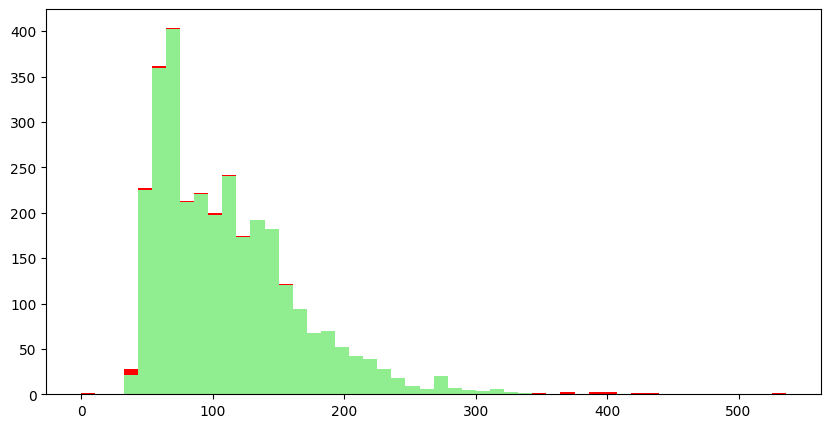

In [117]:
a = df.loc[df['anomaly2'] == 1, 'price_usd']
b = df.loc[df['anomaly2'] == -1, 'price_usd']

fig, ax = plt.subplots(figsize = (10, 5))

ax.hist([a, b], bins = 50, 
        stacked = True, color = ['lightgreen','red'])

plt.show();

In [118]:
df['anomaly2'].value_counts()

anomaly2
 1    3017
-1      31
Name: count, dtype: int64

# 2.6 Gaussian Distribution

<img src="https://miro.medium.com/max/800/1*w5HzgB5ekxQ6Nwmx5ggn8Q.jpeg" height=70% width=70% style="margin-left:15%">

- Assume data is normally distributed

- Use covariance.EllipticEnvelope from scikit-learn to find key params of general distribution by assuming entire dataset = an expression of an underlying multivariate Gaussian distribution

Creating two dfs based on categories defined by sat boolean

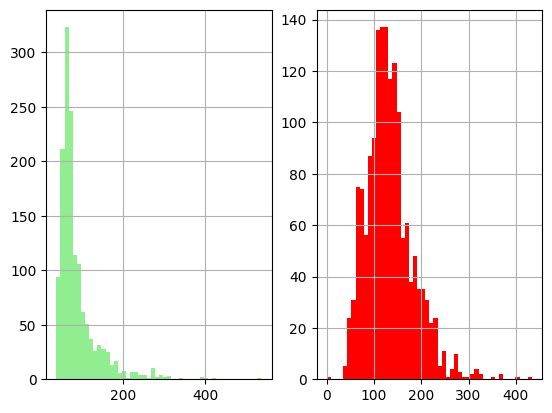

In [121]:
df_class0 = df.loc[df['srch_saturday_night_bool'] == 0, 'price_usd']
df_class1 = df.loc[df['srch_saturday_night_bool'] == 1, 'price_usd']

fig, axs = plt.subplots(1, 2)

df_class0.hist(ax = axs[0], bins = 50, color = 'lightgreen')
df_class1.hist(ax = axs[1], bins = 50, color = 'red');

Apply EllipticEnvelope to each category 

Set contamination param (proportion of outliers present in dataset)

Use decision function to compute decision function of given observations (equivalent to shifted Mahalanobis distances. 

Threshold for identifying as outliers = 0 (compatible with other detection algorithms)

predict(x_train) predict labels of X_train according to fitted model

1 = normal
-1 = anomaly

In [128]:
envelope = EllipticEnvelope(contamination = outliers_fraction)

x_train = df_class0.values.reshape(-1, 1)
envelope.fit(x_train)

df_class0 = pd.DataFrame(df_class0)
df_class0['deviation'] = envelope.decision_function(x_train)
df_class0['anomaly'] = envelope.predict(x_train)

In [129]:
envelope = EllipticEnvelope(contamination = outliers_fraction)

x_train = df_class1.values.reshape(-1, 1)
envelope.fit(x_train)

df_class1 = pd.DataFrame(df_class1)
df_class1['deviation'] = envelope.decision_function(x_train)
df_class1['anomaly'] = envelope.predict(x_train)

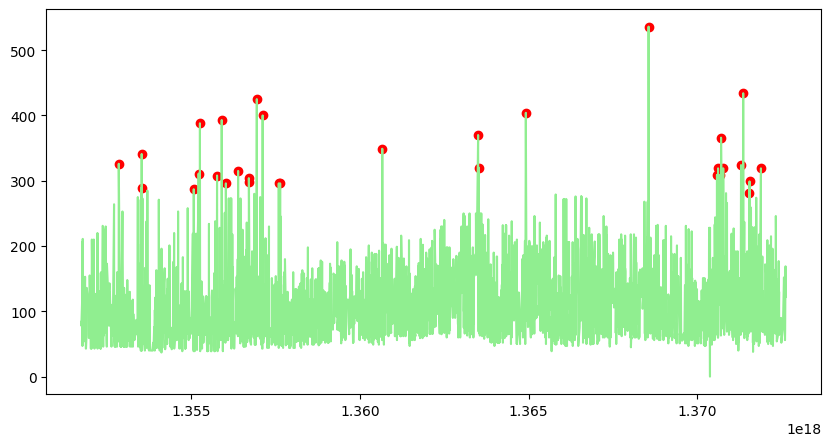

In [130]:
df_class = pd.concat([df_class0, df_class1])
df['anomaly3'] = df_class['anomaly']

fig, ax = plt.subplots(figsize = (10, 5))

a = df.loc[df['anomaly3'] == -1, 
           ('date_time_int', 'price_usd')]

ax.plot(df['date_time_int'], df['price_usd'], 
        color = 'lightgreen')

ax.scatter(a['date_time_int'], a['price_usd'],
          color = 'red')

plt.show();

In [131]:
df['anomaly3'].value_counts()

anomaly3
 1    3017
-1      31
Name: count, dtype: int64

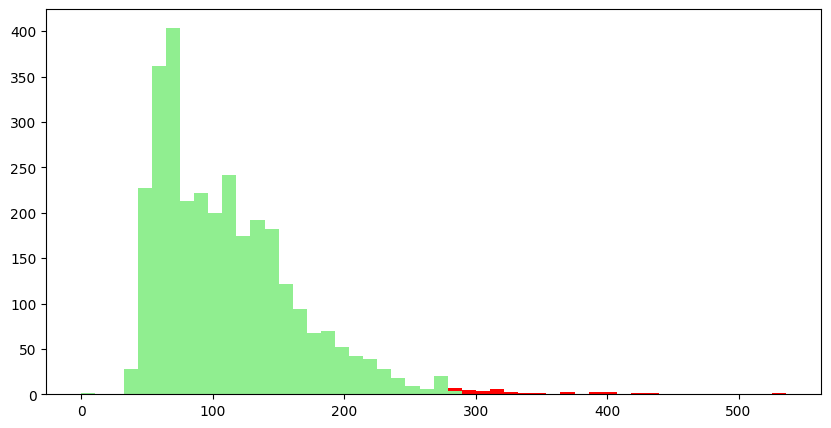

In [132]:
a = df.loc[df['anomaly3'] == 1, 'price_usd']
b = df.loc[df['anomaly3'] == -1, 'price_usd']

fig, ax = plt.subplots(figsize = (10, 5))
ax.hist([a, b], 
        bins = 50, stacked = True, 
        color = ['lightgreen', 'red'])

plt.show();

# 2.7 Analysis 📝

👉🏻 Based on this study, we have observed that Algorithms - **K-Means, 3D Cluster, PCA, Isolation Forest, and Gaussian Distribution** have detected the **high prices**.
<!-- <br><b
<img src="https://jonmgomes.com/wp-content/uploads/2020/05/Comp_1.gif" height=60% width=60% style="margin-left:20%"> -->
<!-- <br><br> -->
👉🏻 But only **One Class SVM** has detected both high prices as well as **low prices**.
<br>
<h3>❓ BUT.. How one class svm made such difference?</h3>

SVM is for novelty detection, a max-margin methods, i.e. they do not model a probability distribution... The idea of novelty detection is to detect rare events, i.e. events that happen rarely, and hence, of which you have very little samples. 
    <br><br>
<img src="https://cdn.dribbble.com/users/2828066/screenshots/14755895/media/eac02ec5ba9d0118c3d289d52dbb20ff.gif" height=98% width=98% style="margin-left:1%">

<h2> 🕵🏻 Anomaly Detection: Sensors | VAR </h2>

<br>

<img src="https://www.outsideonline.com/wp-content/uploads/2019/09/03/bikers-and-peds_h.jpg" height=98% width=98% style="margin-left:1%">

# 3️⃣ Problem Statement 3: Sensors🚦

Detect the outliers/anomalies in the experimental dataset. The dataset stores hourly counting series detected by sensors. These sensors count both people riding bikes and pedestrians. Separate volumes are tallied for each travel mode. Wires in a diamond formation in the concrete detect bikes and an infrared sensor mounted on a wooden post detects pedestrians.


[**Reference**](https://towardsdatascience.com/anomaly-detection-in-multivariate-time-series-with-var-2130f276e5e9)

In [142]:
import scipy.stats as stats
import matplotlib.pyplot as plt

from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.vector_ar.var_model import VAR

import warnings
warnings.simplefilter('ignore')

<h2> Data Set </h2> 

Using a **modified dataset version** of [Seattle Burke Gilman Trail](https://www.kaggle.com/datasets/city-of-seattle/seattle-burke-gilman-trail) (i.e. hosted by the city of Seattle which is part of its open data project). 

The dataset stores hourly counting series detected by sensors. These sensors count both people riding bikes and pedestrians. Separate volumes are tallied for each travel mode. Wires in a diamond formation in the concrete detect bikes and an infrared sensor mounted on a wooden post detects pedestrians.

<img src="https://storage.googleapis.com/static.modelplace.ai/production/model-previews/openvino_person_vehicle_bike_detection_crossroad.gif" height=98% width=98% style="margin-left:1%">

In [164]:
### READ DATA ###

train_hours = 80*7*24  # weeks x hours x days
test_hours = 15*7*24  # weeks x hours x days

df = pd.read_csv('data/mts-trail-west-of-i-90-bridge.csv', nrows=train_hours+test_hours, parse_dates=['Date'])

print(df.shape)
df.head()

(15960, 6)


,Date,MTS Trl West of I-90 Bridge Total,Ped East,Ped West,Bike East,Bike West
0,2013-12-18 00:00:00,1.0,0.0,0.0,0.0,1.0
1,2013-12-18 01:00:00,1.0,0.0,0.0,0.0,1.0
2,2013-12-18 02:00:00,3.0,1.0,1.0,1.0,0.0
3,2013-12-18 03:00:00,1.0,1.0,0.0,0.0,0.0
4,2013-12-18 04:00:00,2.0,0.0,0.0,2.0,0.0


In [165]:
### FILL NAN ###

df['Ped East'] = df['Ped East'].groupby(df.Date.dt.hour).transform(lambda x: x.fillna(x.median()))
df['Ped West'] = df['Ped West'].groupby(df.Date.dt.hour).transform(lambda x: x.fillna(x.median()))
df['Bike East'] = df['Bike East'].groupby(df.Date.dt.hour).transform(lambda x: x.fillna(x.median()))
df['Bike West'] = df['Bike West'].groupby(df.Date.dt.hour).transform(lambda x: x.fillna(x.median()))
df['BGT West of NE 70th Total'] = df['Ped East'] + df['Ped West'] + df['Bike East'] + df['Bike West']

df['Date'] = pd.to_datetime(df['Date'].dt.date)

In [169]:
df['Date']

0       2013-12-18
1       2013-12-18
2       2013-12-18
3       2013-12-18
4       2013-12-18
           ...    
15955   2015-10-13
15956   2015-10-13
15957   2015-10-13
15958   2015-10-13
15959   2015-10-13
Name: Date, Length: 15960, dtype: datetime64[ns]

In [166]:
### DAILY AGGREGATION ###

df_day = pd.DataFrame()
df_day['Ped East'] = df.groupby(df.Date)['Ped East'].sum()
df_day['Ped West'] = df.groupby(df.Date)['Ped West'].sum()
df_day['Bike East'] = df.groupby(df.Date)['Bike East'].sum()
df_day['Bike West'] = df.groupby(df.Date)['Bike West'].sum()
df_day['Total'] = df.groupby(df.Date)['BGT West of NE 70th Total'].sum()

df_day.index = pd.DatetimeIndex(df_day.index.values, freq=df_day.index.inferred_freq)

In [167]:
df_day['Total']

2013-12-18     436.0
2013-12-19     298.0
2013-12-20      63.0
2013-12-21     481.0
2013-12-22     265.0
               ...  
2015-10-09     572.0
2015-10-10     297.0
2015-10-11    1249.0
2015-10-12     689.0
2015-10-13     581.0
Freq: D, Name: Total, Length: 665, dtype: float64

In [146]:
def show_traces_column(
    df: pd.DataFrame
):
    fig = go.Figure()
    for col_name in df.columns.to_list()[1:] :
        fig.add_trace(go.Scatter(x = df.Date, y = df[col_name], mode='lines', name = col_name))
    fig.show()

show_traces_column(df.iloc[:,:])

In total, 5 counting series are supplied. 2 related to pedestrian count, 2 related to bike count, and the total which is the sum of the previous series. There are double counters for pedestrians and bikes because two directions of travel are registered.

In [147]:
### TRAIN SPLIT ###

train = df_day[:(train_hours//24)].copy()

train.shape

(560, 5)

In [148]:
### TOTAL COUNT TRAIN AUTOCORR ###
plt.figure(figsize=(16,6), dpi= 1000)
pd.plotting.autocorrelation_plot(train['Total'])

<Axes: xlabel='Lag', ylabel='Autocorrelation'>

## 周期信号的自相关图

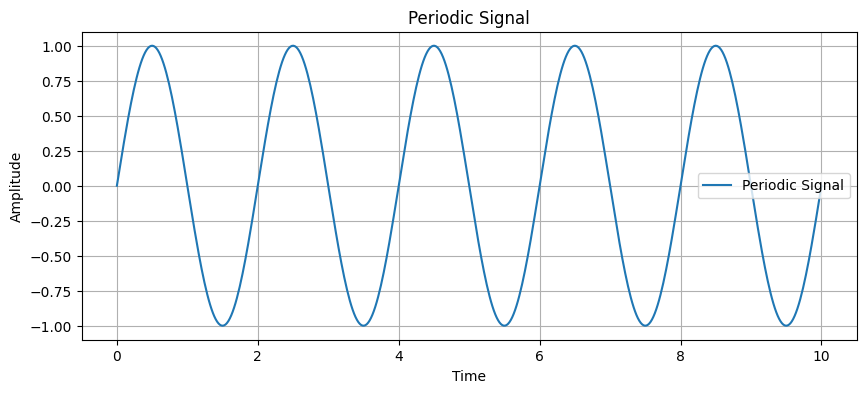

<Figure size 1000x400 with 0 Axes>

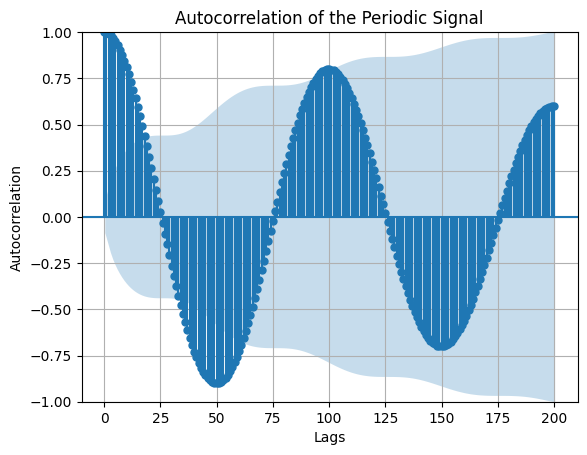

In [149]:
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf

# 创建周期信号
t = np.linspace(0, 10, 500)  # 时间向量
period = 2  # 周期设为2秒
amplitude = 1  # 振幅设为1
signal = amplitude * np.sin(2 * np.pi * t / period)  # 正弦波信号

# 绘制信号
plt.figure(figsize=(10, 4))
plt.plot(t, signal, label='Periodic Signal')
plt.title('Periodic Signal')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.legend()
plt.grid(True)
plt.show()

# 计算并绘制自相关图
plt.figure(figsize=(10, 4))
plot_acf(signal, lags=200, alpha=0.05)  # 绘制自相关图，滞后数设为50
plt.title('Autocorrelation of the Periodic Signal')
plt.xlabel('Lags')
plt.ylabel('Autocorrelation')
plt.grid(True)
plt.show()


##   

In [150]:
'''
Train   560 rows × 5 columns------------------------------------------
Ped East	Ped West	Bike East	Bike West	Total
2013-12-18	90.0	110.0	127.0	109.0	436.0
2013-12-19	26.0	31.0	121.0	120.0	298.0
2013-12-20	13.0	10.0	22.0	18.0	63.0
2013-12-21	50.0	42.0	206.0	183.0	481.0
2013-12-22	23.0	24.0	122.0	96.0	265.0
...	...	...	...	...	...
2015-06-26	27.0	44.0	585.0	292.0	948.0
2015-06-27	21.0	93.0	1011.0	509.0	1634.0
2015-06-28	29.0	159.0	677.0	538.0	1403.0
2015-06-29	8.0	64.0	533.0	279.0	884.0
2015-06-30	35.0	95.0	758.0	445.0	1333.0

train.index----------------------------------------------------------
DatetimeIndex(['2013-12-18', '2013-12-19', '2013-12-20', '2013-12-21',
               '2013-12-22', '2013-12-23', '2013-12-24', '2013-12-25',
               '2013-12-26', '2013-12-27',
               ...
               '2015-06-21', '2015-06-22', '2015-06-23', '2015-06-24',
               '2015-06-25', '2015-06-26', '2015-06-27', '2015-06-28',
               '2015-06-29', '2015-06-30'],
              dtype='datetime64[ns]', length=560, freq='D')
              
train.index.month-----------------------------------------------------
Index([12, 12, 12, 12, 12, 12, 12, 12, 12, 12,
       ...
        6,  6,  6,  6,  6,  6,  6,  6,  6,  6],
      dtype='int32', length=560)
'''
#---------------------------------------------------------------------
### MONTHLY TRAIN MEAN ###

month_mean_train = train.groupby(train.index.month).mean()
month_mean_train

,Ped East,Ped West,Bike East,Bike West,Total
1,63.322581,63.225806,224.258065,193.870968,544.677419
2,55.892857,56.696429,173.232143,143.785714,429.607143
3,84.500000,83.661290,280.225806,235.806452,684.193548
4,134.616667,125.366667,434.916667,341.466667,1036.366667
5,190.000000,156.903226,605.080645,455.854839,1407.838710
6,103.983333,120.366667,628.183333,446.533333,1299.066667
7,143.096774,131.806452,696.193548,447.645161,1418.741935
8,244.451613,278.870968,569.032258,404.838710,1497.193548
9,119.133333,138.533333,438.433333,347.100000,1043.200000
10,68.096774,74.322581,286.064516,249.774194,678.258065


In [151]:
### REMOVE LONG TERM SEASONALITY FROM TRAIN ###

train['Ped East'] = train.apply(lambda x: x['Ped East'] - month_mean_train['Ped East'][x.name.month], axis=1)
train['Ped West'] = train.apply(lambda x: x['Ped West'] - month_mean_train['Ped West'][x.name.month], axis=1)
train['Bike East'] = train.apply(lambda x: x['Bike East'] - month_mean_train['Bike East'][x.name.month], axis=1)
train['Bike West'] = train.apply(lambda x: x['Bike West'] - month_mean_train['Bike West'][x.name.month], axis=1)
train['Total'] = train.apply(lambda x: x['Total'] - month_mean_train['Total'][x.name.month], axis=1)

##### 代码解析


- train['Ped East']: 这部分指定了要操作的DataFrame列。这意味着我们要更新 train DataFrame中的“Ped East”列。

- train.apply(..., axis=1): apply 函数在DataFrame上应用一个函数，axis=1 参数确保函数是沿着行应用的（即逐行执行）。这使得每次函数调用都接收到一个表示行的Series对象。

- lambda x: ...: 这是一个匿名函数，其中 x 是传递给函数的每行数据（作为Series对象）。lambda 函数对每行进行计算，并返回一个值，这个值将被用来更新对应行的“Ped East”列。

- x['Ped East'] - month_mean_train['Ped East'][x.name.month]: 这部分是 lambda 函数的核心计算：

- x['Ped East']: 访问当前行的“Ped East”值。
- x.name: 这通常返回行的索引。在这个上下文中，假设 train DataFrame的索引是一个日期类型（如DatetimeIndex），那么x.name.month将返回这个日期的月份部分。
- month_mean_train['Ped East'][x.name.month]: 这是从另一个DataFrame（或类似结构）month_mean_train中获取的，它存储了“Ped East”在每个月的平均值。month_mean_train['Ped East']访问这些月平均值，[x.name.month]根据当前行的月份选择相应的平均值。
- 最后，从原始的“Ped East”值中减去对应月份的平均值，结果是调整后的值，消除了季节性影响。
- 总结
这行代码的作用是对“Ped East”列中的每个值减去其对应月份的平均值，从而消除数据中的季节性（长期季节性）。这种处理对于时间序列分析中控制季节性变量非常有用，特别是当你希望模型关注除季节性影响外的其他模式时。

In [152]:
### TOTAL COUNT TRAIN AUTOCORR ###

plt.figure(figsize=(16,6), dpi= 1000)
pd.plotting.autocorrelation_plot(train['Total'])

<Axes: xlabel='Lag', ylabel='Autocorrelation'>

Passing to a multivariate approach considering all the series and their interaction in the system.

In [153]:
### TRAIN TEST SPLIT IN MULTIVARIATE CASE ###

train_uni = train['Total'].copy()
test_uni = df_day['Total'][(train_hours//24):].copy()
test_uni = test_uni - test_uni.index.month.map(month_mean_train['Total'])

train.drop('Total', inplace=True, axis=1)

# 3.1 Vector AutoRegression

<img src="https://miro.medium.com/max/1200/0*YplXpgxXCFhf8x34.jpg" height=98% width=98% style="margin-left:1%">

VAR 模型是一个随机过程，它将一组时间相关变量表示为它们自己的过去值和组中所有其他变量的过去值的线性函数。

VAR model is a stochastic process that represents a group of time-dependent variables as a linear function of their own past values and the past values of all the other variables in the group.
​
Here,
​
VAR training is computed as before selecting the best order minimizing AIC. The data are standardized in the same way to remove the long term seasonality. Not surprisingly the best model is a VAR(7). After testing the independence and normality of residual data, a Hotelling’s T-squared statistic can be computed to detect the early presence of anomalies:
​
<img src="https://miro.medium.com/max/640/1*lKy-CgCI4qmS9anrp1QdFw.webp" height=40% width=40% style="margin-left:30%">
​
<p style="margin-left:7%"> <i> <b> the formula for Hotelling T2. e are the estimated residuals; Sigma is the covariance matrix of e </b> </i> </p>
​
The application of the T-squared control chart is conducted in two phases: the control limit establishment phase, and the monitoring phase. The first phase focuses on obtaining model residuals so that the calculated control limit can be used in phase two for monitoring the residual process of future anomalies. The control limit for the T-squared control chart is given by:
​
<img src="https://miro.medium.com/max/828/1*404AbCeKlaRnptda26T5KQ.webp" height=50% width=50% style="margin-left:25%">
​
<p style="margin-left:35%"> <i> <b> Upper Control Limit statistic </b> </i> </p>
​


In [154]:
### FIND BEST MULTIVARIATE MODEL ###
AIC = {}
best_aic, best_order = np.inf, 0

for i in range(1,50):
    model = VAR(endog=train)
    var_result = model.fit(maxlags=i)
    AIC[i] = var_result.aic
    
    if AIC[i] < best_aic:
        best_aic = AIC[i]
        best_order = i
        best_model = var_result
        
print('BEST ORDER', best_order, 'BEST AIC:', best_aic)
var_result = best_model


BEST ORDER 4 BEST AIC: 35.41893067698374


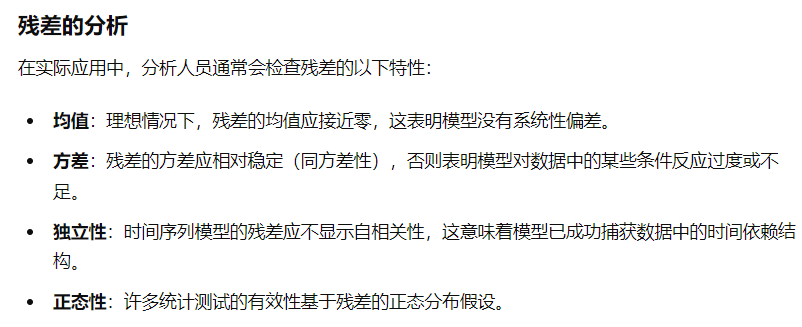

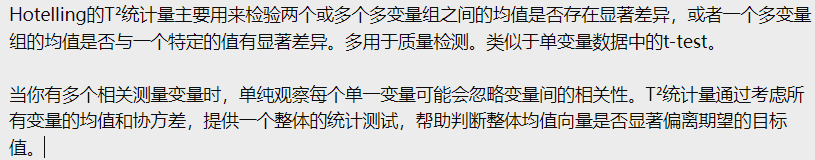

In [172]:
residuals

array([[-0.09650648, -0.10916124, -0.67183983, -0.75718324],
       [ 0.11851829,  0.18600151, -0.1638827 , -0.12575004],
       [-0.08158685,  0.05461209,  0.28386889,  0.3618246 ],
       ...,
       [-0.29287949,  0.46581561, -0.81886491,  0.20437237],
       [-0.75093061, -0.98856677, -0.53039768, -1.12734485],
       [-0.01184417,  0.16250366,  1.55509319,  0.7173044 ]])

In [173]:
T

array([6.17327780e-01, 8.71119717e-02, 2.03436277e-01, 6.85021199e-01,
       3.28130124e-01, 4.86172456e-01, 9.70086349e-01, 5.12684134e-01,
       6.61672207e-01, 5.26302776e-01, 4.07553973e-01, 8.13426361e-01,
       1.63195405e-01, 1.30082201e+00, 1.46388780e-01, 2.60744513e-01,
       4.83511213e-01, 5.68333177e-01, 3.51320900e-01, 8.45597928e-01,
       1.73474585e+00, 1.08570358e+00, 2.64263920e-01, 3.64140733e-02,
       2.08173651e-02, 9.64848244e-02, 3.53472794e-01, 2.42261067e+00,
       1.37400849e+00, 4.60225360e-01, 3.62350214e-01, 1.28195012e-01,
       6.07797616e-02, 1.45177076e-01, 4.98331698e+00, 1.17035462e+00,
       1.70451938e+00, 7.66997000e-01, 5.04177845e-01, 8.96481975e-02,
       3.25207734e-01, 2.76683098e+00, 2.91993653e-02, 3.17448608e-01,
       1.93897246e-01, 2.05283210e+00, 1.51370578e+00, 2.77503852e-01,
       1.13268170e-01, 1.66411827e+00, 9.52586308e-02, 5.51283365e-01,
       2.84220717e-01, 1.25550982e-01, 3.55417952e-01, 5.18859785e-01,
      

In [ ]:
### COMPUTE TRAIN T2 METRIC ###
# 残差均值
residuals_mean = var_result.resid.values.mean(axis=0)
# 残差标准差
residuals_std = var_result.resid.values.std(axis=0)
# ----------------------------------------------------------------------
# 下面的代码是计算T2统计量的步骤：
# 
# 1.标准化残差 0均值，单位方差
residuals = (var_result.resid.values - residuals_mean) / residuals_std
# 2. 计算协方差矩阵，用于计算T2统计量
cov_residuals = np.linalg.inv(np.cov(residuals.T))
# 3. 计算T2统计量
T = np.diag((residuals).dot(cov_residuals).dot(residuals.T))
# print('T2:', T)

### COMPUTE UCL ###
# 计算UCL，即T2统计量的上限，用于检测异常，这里使用F分布来计算UCL。
m = var_result.nobs
p = var_result.resid.shape[-1]
alpha = 0.01

UCL = stats.f.ppf(1-alpha, dfn=p, dfd=m-p) *(p*(m+1)*(m-1)/(m*m-m*p))
print('UCL:', UCL)

👉🏻 Where F represents an F distribution with p and n-p degrees of freedom and alpha significance level. If T2 > UCL, then stop and investigate. The estimated Sigma obtained at the end of phase 1 (together with residuals mean and standard deviation) is used to calculate the T-squared statistic for each new observation.

如果T²统计量的值超过了上控制限（UCL），则是异常点。

In [157]:
'''
len(T) = 556


train.index[best_order:]
DatetimeIndex(['2013-12-22', '2013-12-23', '2013-12-24', '2013-12-25',
               '2013-12-26', '2013-12-27', '2013-12-28', '2013-12-29',
               '2013-12-30', '2013-12-31',
               ...
               '2015-06-21', '2015-06-22', '2015-06-23', '2015-06-24',
               '2015-06-25', '2015-06-26', '2015-06-27', '2015-06-28',
               '2015-06-29', '2015-06-30'],
              dtype='datetime64[ns]', length=556, freq='D')
'''
### PLOT TRAIN T2 METRIC ###

plt.figure(figsize=(16,6), dpi= 1000)
plt.plot(train.index[best_order:], T)
plt.ylabel('T-squared')
plt.axhline(UCL, c='red', linestyle='--')

# 3.2 Analysis 📝

<img src="https://miro.medium.com/max/1400/1*dSHTs4h5NQT9vDVkj5sEGA.png" height=40% width=40% style="margin-left:30%">

VAR model extends the univariate autoregressive (AR) model by capturing the linear relations between multiple variables. For each input series, a regression is carried out. The original variables are regressed against their own lagged values and the lagged values of other variables. For our multivariate task, we take into account both bike and pedestrian series.

In a multivariate process system with the presence of serial correlation, we use VAR models to approximate the system and monitor the residuals as a serially independent series. Using a VAR to approximate a linear system is appropriate due to the physical principles of the process dynamics.

In [158]:
### TEST SPLIT IN MULTIVARIATE CASE ###

test = df_day[(train_hours//24-best_order):].copy()
test.drop('Total', inplace=True, axis=1)

test.shape

(109, 4)

In [159]:
### REMOVE LONG TERM SEASONALITY FROM TEST ###
test['Ped East'] = test.apply(lambda x: x['Ped East'] - month_mean_train['Ped East'][x.name.month], axis=1)
test['Ped West'] = test.apply(lambda x: x['Ped West'] - month_mean_train['Ped West'][x.name.month], axis=1)
test['Bike East'] = test.apply(lambda x: x['Bike East'] - month_mean_train['Bike East'][x.name.month], axis=1)
test['Bike West'] = test.apply(lambda x: x['Bike West'] - month_mean_train['Bike West'][x.name.month], axis=1)

### ITERATIVE PREDICTIONS ON TEST DATA ###
pred = []
'''
test:
Ped East	Ped West	Bike East	Bike West
2015-06-27	-186.966667	-147.733333	-245.366667	-384.066667
2015-06-28	-178.966667	-81.733333	-579.366667	-355.066667
2015-07-01	-269.193548	-167.612903	-627.387097	-543.290323
...	...	...	...	...
2015-10-12	-75.193548	-62.645161	-274.129032	-255.548387
2015-10-13	-87.193548	-93.645161	-321.129032	-273.548387
109 rows × 4 columns
'''
for i in range(best_order, len(test)):
    pred.append(var_result.forecast(test.iloc[i-best_order:i].values, steps=1))

pred = np.vstack(pred)
print(pred.shape)

### COMPUTE TEST T2 METRIC ###
residuals_test = test.iloc[best_order:].values - pred
residuals_test = (residuals_test - residuals_mean) / residuals_std

T_test = np.diag((residuals_test).dot(cov_residuals).dot(residuals_test.T))

(105, 4)


✏️ Here, I collected the VAR residuals and used them to build a threshold alert system, which flags an alarm in case of anomalous behaviors.





In [160]:
'''
from training
UCL = 13.510289428754227

'''
# 首先确定哪些T²值大于UCL
over_ucl_mask = T_test > UCL

# 获取对应这些异常值的时间索引
abnormal_timestamps = test.iloc[best_order:].index[over_ucl_mask]

# 打印异常值对应的时间戳
print("异常值对应的时间戳:")
print(abnormal_timestamps)

异常值对应的时间戳:
DatetimeIndex(['2015-07-30', '2015-07-31', '2015-08-01', '2015-08-02',
               '2015-08-03', '2015-08-04', '2015-08-05', '2015-08-06',
               '2015-08-09', '2015-09-18'],
              dtype='datetime64[ns]', freq=None)


In [161]:
plt.figure(figsize=(16,6), dpi=1000)
plt.plot(test.iloc[best_order:].index, T_test, label='T-squared values')
plt.scatter(abnormal_timestamps, T_test[over_ucl_mask], color='red', label='Outliers')  # 标记异常值
plt.axhline(UCL, color='red', linestyle='--', label='UCL')
plt.ylabel('T-squared')
plt.title('Test T-squared Metric with Outliers')
plt.legend()
plt.show()


Real time application

In [162]:
### COMPUTE TRAIN T2 METRIC ###

# 残差均值
residuals_mean = var_result.resid.values.mean(axis=0)
# 残差标准差
residuals_std = var_result.resid.values.std(axis=0)
# 标准化残差 0均值，单位方差
residuals = (var_result.resid.values - residuals_mean) / residuals_std
# 计算协方差矩阵，用于计算T2统计量
cov_residuals = np.linalg.inv(np.cov(residuals.T))

T = np.diag((residuals).dot(cov_residuals).dot(residuals.T))

In [163]:
abnormal_timestamps = []

def remove_seasonality(pred_data):
    for column in ['Ped East', 'Ped West', 'Bike East', 'Bike West']:
        pred_data[column] = pred_data.apply(lambda x: x[column] - month_mean_train[column][x.name.month], axis=1)
    return pred_data

def predict_and_detect(pred_data):
    '''
    pred_data: 
                 Ped East   Ped West   Bike East   Bike West
    2015-06-27  -82.983333 -27.366667  382.816667   62.466667
    2015-06-28  -74.983333  38.633333   48.816667   91.466667
    2015-06-29  -95.983333 -56.366667  -95.183333 -167.533333
    2015-06-30  -68.983333 -25.366667  129.816667   -1.533333
    2015-07-01 -126.096774 -35.806452   68.806452  -95.645161
    2015-07-02 -114.096774 -84.806452  -41.193548 -129.645161
    2015-07-03  -46.096774 -10.806452   59.806452  -57.645161
    2015-07-04 -107.096774 -18.806452   87.806452  -43.645161
    2015-07-05 -116.096774 -65.806452  228.806452  -32.645161
    2015-07-06 -117.096774 -28.806452 -123.193548 -136.645161
    '''
    # 假设每次输入是10个监控值的DataFrame 10*4
    new_pred = []
    # 确保 pred_data 至少有 best_order 行数据
    if len(pred_data) >= best_order:
        for i in range(best_order, len(pred_data)):
            new_pred.append(var_result.forecast(pred_data.iloc[i-best_order:i].values, steps=1))
        # 如果 new_pred 为空，则不执行 np.vstack
        if new_pred:
            new_pred = np.vstack(new_pred)
        else:
            print("No predictions were made due to insufficient data.")
            return None, pred_data.iloc[best_order:].index  # 或者适当的默认值
    else:
        # print("Not enough data to make predictions.")
        return None, pred_data.iloc[best_order:].index  # 或者适当的默认值
    '''
    new_pred: 
    [[-29.7338733   26.23259132  89.36743286  41.52800336]
    [-70.8853915  -25.6406824    5.66445042 -47.98118328]
    [-76.01996643 -37.38817594  24.45153718 -19.39430962]
    [ -0.30872747  27.63148597   9.98642279 -21.52362993]
    [-74.73226428  -2.86779294  40.23452029  -8.11772349]
    [-57.04008105 -31.02994369 111.39993613  22.53573073]]
    '''

    # 计算每个监控值的残差
    residuals_test = pred_data.iloc[best_order:].values - new_pred
    residuals_test = (residuals_test - residuals_mean) / residuals_std

    # 计算T²值
    if len(residuals_test.shape) == 1:
        residuals_test = residuals_test.reshape(1, -1)
    T_test_value = np.diag(residuals_test.dot(cov_residuals).dot(residuals_test.T))
    # T²值:  [ 7.73665024  1.20084192  2.0554539   4.89641667 12.1021739   3.15436206]

    # 检测异常并记录时间戳
    abnormal_timestamps = pred_data.iloc[best_order:].index[T_test_value > UCL]
    print("异常值对应的时间戳: ", abnormal_timestamps)
    
    return T_test_value, abnormal_timestamps

def plot_t_squared_with_outliers(pred_data, T_test_value, UCL, abnormal_timestamps):
    # 添加T-squared值的线，可以指定一个特定的颜色
    line_color = 'red' if not abnormal_timestamps.empty else 'blue'
    fig.add_trace(go.Scatter(
        x=pred_data.iloc[best_order:].index,
        y=T_test_value,
        mode='lines',
        name='T-squared values',
        line=dict(color=line_color)  # 为T-squared值指定蓝色
    ))

    # 标记异常值
    # 提取异常值对应的T²值
    outlier_values = [T_test_value[i] for i, date in enumerate(pred_data.iloc[best_order:].index) if date in abnormal_timestamps]
    fig.add_trace(go.Scatter(
        x=list(abnormal_timestamps),
        y=outlier_values,
        mode='markers',
        marker=dict(color='red', size=10),
        name='Outliers'
    ))

    # 添加UCL水平线
    fig.add_hline(y=UCL, line=dict(color='green', dash='dash'), annotation_text="UCL", annotation_position="bottom right")

    # 设置图表标题和轴标签
    fig.update_layout(
        title='Test T-squared Metric with Outliers',
        xaxis_title='Date',
        yaxis_title='T-squared',
        legend_title='Legend',
        legend=dict(
            yanchor="top",
            y=0.99,
            xanchor="left",
            x=0.01
        )
    )

fig = go.Figure()
for i in range(0,500,10): 
    upper_bound = i + best_order + 10
    if upper_bound > len(test):
        upper_bound = len(test)
    pred_data = test.iloc[i:upper_bound]
    # Remove seasonality
    # pred_data = remove_seasonality(pred_data)
    # 预测并检测异常
    T_test_value, abnormal_timestamps = predict_and_detect(pred_data)
    # 绘制T²值和异常值
    plot_t_squared_with_outliers(pred_data, T_test_value, UCL, abnormal_timestamps)

# 显示图形
fig.show()
'''
异常值对应的时间戳:
DatetimeIndex(['2015-07-30', '2015-07-31', '2015-08-01', '2015-08-02',
               '2015-08-03', '2015-08-04', '2015-08-05', '2015-08-06',
               '2015-08-09', '2015-09-18'],
              dtype='datetime64[ns]', freq=None)
'''

异常值对应的时间戳:  DatetimeIndex([], dtype='datetime64[ns]', freq='D')
异常值对应的时间戳:  DatetimeIndex([], dtype='datetime64[ns]', freq='D')
异常值对应的时间戳:  DatetimeIndex(['2015-07-30'], dtype='datetime64[ns]', freq='D')
异常值对应的时间戳:  DatetimeIndex(['2015-07-31', '2015-08-01', '2015-08-02', '2015-08-03',
               '2015-08-04', '2015-08-05', '2015-08-06', '2015-08-09'],
              dtype='datetime64[ns]', freq=None)
异常值对应的时间戳:  DatetimeIndex([], dtype='datetime64[ns]', freq='D')
异常值对应的时间戳:  DatetimeIndex([], dtype='datetime64[ns]', freq='D')
异常值对应的时间戳:  DatetimeIndex([], dtype='datetime64[ns]', freq='D')
异常值对应的时间戳:  DatetimeIndex(['2015-09-18'], dtype='datetime64[ns]', freq='D')
异常值对应的时间戳:  DatetimeIndex([], dtype='datetime64[ns]', freq='D')
异常值对应的时间戳:  DatetimeIndex([], dtype='datetime64[ns]', freq='D')
异常值对应的时间戳:  DatetimeIndex([], dtype='datetime64[ns]', freq='D')


"\n异常值对应的时间戳:\nDatetimeIndex(['2015-07-30', '2015-07-31', '2015-08-01', '2015-08-02',\n               '2015-08-03', '2015-08-04', '2015-08-05', '2015-08-06',\n               '2015-08-09', '2015-09-18'],\n              dtype='datetime64[ns]', freq=None)\n"

1. Data Prediction
You use the var_result.forecast() method to predict future values for each monitoring point. Assuming var_result is a pre-trained Vector Autoregression (VAR) model, it uses historical data (pred_data.iloc[i-best_order:i].values) to forecast future values (steps=1). VAR models can process multiple interrelated time series simultaneously.

2. Calculate Residuals
Residuals are the differences between the actual observed values and the predicted values by the model. In your code, pred_data.iloc[best_order:].values - new_pred calculates these residuals. Residuals are fundamental in anomaly detection because they reflect the discrepancies between predictions and actual outcomes.

3. Normalize Residuals
Normalizing residuals helps to remove scale effects and make the residuals comparable. This is achieved by (residuals_test - residuals_mean) / residuals_std, where residuals_mean and residuals_std are the mean and standard deviation of the residuals. This step prepares the residuals for further statistical analysis, especially important in multivariate settings.

4. Calculate T² Values
Hotelling's T² statistic is a multivariate tool used to detect significant differences between a multivariate sample and a population. The calculation np.diag(residuals_test.dot(cov_residuals).dot(residuals_test.T)) computes the T² values for each sample, where cov_residuals is the covariance matrix of the residuals, assessing the correlation between residuals of different variables. High T² values suggest significant deviations from model predictions, potentially indicating anomalies.

5. Detect Anomalies and Record Timestamps
Anomalies are detected by comparing each sample's T² value with a predefined Upper Control Limit (UCL). If the T² value exceeds the UCL, it indicates that the data point significantly differs from the model's predictions and is considered anomalous. T_test_value > UCL identifies these points, and pred_data.iloc[best_order:].index[T_test_value > UCL] records their timestamps.